In [4]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import sklearn.preprocessing as preprocessing

### 温度计读数对应关系

In [7]:
t1 = np.array([0.5,  14.0, 15.0, 28.0, 11.0,  8.0,  3.0, -4.0,  6.0, 13.0, 21.0])
t2 = np.array([35.7, 55.9, 58.2, 81.9, 56.3, 48.9, 33.9, 21.8, 48.4, 60.4, 68.4])
# 正则化数据
scaler1 = preprocessing.StandardScaler().fit(t1.reshape(-1,1))
scaler2 = preprocessing.StandardScaler().fit(t2.reshape(-1,1))
t1 = scaler1.transform(t1.reshape(-1,1))
t2 = scaler2.transform(t2.reshape(-1,1))
print(t1, t2)

[[-1.13859801]
 [ 0.3985093 ]
 [ 0.5123691 ]
 [ 1.99254651]
 [ 0.0569299 ]
 [-0.2846495 ]
 [-0.85394851]
 [-1.65096711]
 [-0.5123691 ]
 [ 0.2846495 ]
 [ 1.19552791]] [[-1.00320156]
 [ 0.25547369]
 [ 0.3987882 ]
 [ 1.87555075]
 [ 0.28039795]
 [-0.1807009 ]
 [-1.11536075]
 [-1.86931969]
 [-0.21185623]
 [ 0.53587164]
 [ 1.03435689]]


### 数据关系散点图

In [8]:
def display_data(datas, labels):
    plt.scatter(datas, labels)
    plt.xlabel("t1")
    plt.ylabel("t2")
    plt.show()

### 定义模型

In [9]:
def linearModel(datas, w, b):
    #return torch.mm(datas, w) + b
    return datas * w + b

### 定义损失函数

In [10]:
def loss(labels, y):
    # 使用平方损失函数
    squared_diffs = (y - labels) ** 2
    return squared_diffs.mean()

### 梯度下降优化算法

In [11]:
# 计算 df / dw
def dmodel_dw(t1, w, b):
    return t1

# 计算df / db
def dmodel_db(t1, w, b):
    return 1.0

# dl / df
def dloss_f(t2, y):
    return 2 * (y - t2) 

# 梯度下降
def grad_f(t1, t2, y, w, b):
    # dl / dw = dl / df * df / dw
    dloss_dw = dloss_f(t2, y) * dmodel_dw(t1, w, b)
    dloss_db = dloss_f(t2, y) * dmodel_db(t1, w ,b)
    return torch.stack([dloss_dw.mean(), dloss_db.mean()])

### 训练模型

In [12]:
def training_loop(n_epochs, lr, params, t1, t2):
    for epoch in range(n_epochs+1):
        w, b = params
        y = linearModel(t1, w, b) # 前向传播
        Loss = loss(t2, y)
        grad = grad_f(t1, t2, y, w, b)
        params = params - lr * grad    # 后向传播
        print('Epoch %d, Loss %f' % (epoch, float(Loss)))
        print('    Parmas:', params)
    return params

### 模型训练2（利用导数定义更新参数）

In [13]:
def training_loop_2(n_epochs, lr, params, t1, t2, delta=0.1):
    w, b = params
    for epoch in range(n_epochs+1):
        y2 = loss(linearModel(t1, w + delta, b), t2)
        y1 = loss(linearModel(t1, w - delta, b), t2)
        loss_rate_of_change_w = (y2 - y1) / (2 * delta)
        y4 = loss(linearModel(t1, w, b + delta), t2)
        y3 = loss(linearModel(t1, w, b - delta), t2)
        loss_rate_of_change_b = (y4 - y3) / (2 * delta)
        w = w - lr * loss_rate_of_change_w
        b = b - lr * loss_rate_of_change_b
        print('Epoch %d, Loss %f' % (epoch, float(loss(t2, linearModel(t1, w, b)))))
        print('    Parmas:', (w, b))
    return (w,b)

### 拟合曲线

In [14]:
def fit_curve(t1, t2, params):
    w, b = params.numpy()
    print(w, b)
    plt.plot(t1, linearModel(t1, w, b))
    plt.scatter(t1, t2)
    plt.xlabel("t1")
    plt.ylabel("t2")
    plt.show()

### 主函数

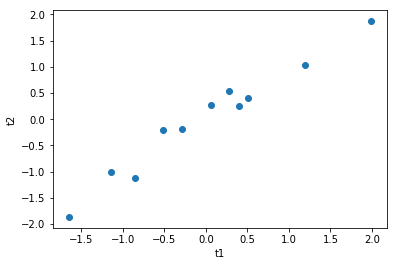

In [15]:
if __name__ == "__main__":
    display_data(t1, t2)
    # 由图可知二者成线性关系

In [16]:
w = torch.ones(1)
b = torch.ones(1)
y = linearModel(torch.tensor(t1), w, b)
print(y)
# print(loss(t2, linearModel(t1, w, b)))
print(loss(torch.tensor(t2), y))

tensor([[-0.1386],
        [ 1.3985],
        [ 1.5124],
        [ 2.9925],
        [ 1.0569],
        [ 0.7154],
        [ 0.1461],
        [-0.6510],
        [ 0.4876],
        [ 1.2846],
        [ 2.1955]], dtype=torch.float64)
tensor(1.0383, dtype=torch.float64)


In [17]:
n_epochs = 50000
lr = 0.0001
params = torch.tensor([1, 0])
params = training_loop(n_epochs=n_epochs, lr=lr, params=params, t1=torch.tensor(t1), t2=torch.tensor(t2))

Epoch 0, Loss 0.038321
    Parmas: tensor([1.0000e+00, 3.7344e-20], dtype=torch.float64)
Epoch 1, Loss 0.038321
    Parmas: tensor([9.9999e-01, 6.7623e-20], dtype=torch.float64)
Epoch 2, Loss 0.038321
    Parmas: tensor([9.9999e-01, 1.0598e-19], dtype=torch.float64)
Epoch 3, Loss 0.038321
    Parmas: tensor([9.9998e-01, 1.4130e-19], dtype=torch.float64)
Epoch 4, Loss 0.038321
    Parmas: tensor([9.9998e-01, 1.7864e-19], dtype=torch.float64)
Epoch 5, Loss 0.038321
    Parmas: tensor([9.9998e-01, 2.1599e-19], dtype=torch.float64)
Epoch 6, Loss 0.038320
    Parmas: tensor([9.9997e-01, 2.5434e-19], dtype=torch.float64)
Epoch 7, Loss 0.038320
    Parmas: tensor([9.9997e-01, 2.9068e-19], dtype=torch.float64)
Epoch 8, Loss 0.038320
    Parmas: tensor([9.9997e-01, 3.2802e-19], dtype=torch.float64)
Epoch 9, Loss 0.038320
    Parmas: tensor([9.9996e-01, 3.6536e-19], dtype=torch.float64)
Epoch 10, Loss 0.038320
    Parmas: tensor([9.9996e-01, 4.0372e-19], dtype=torch.float64)
Epoch 11, Loss 0.038

    Parmas: tensor([9.9875e-01, 1.2443e-17], dtype=torch.float64)
Epoch 338, Loss 0.038275
    Parmas: tensor([9.9874e-01, 1.2483e-17], dtype=torch.float64)
Epoch 339, Loss 0.038275
    Parmas: tensor([9.9874e-01, 1.2524e-17], dtype=torch.float64)
Epoch 340, Loss 0.038275
    Parmas: tensor([9.9874e-01, 1.2565e-17], dtype=torch.float64)
Epoch 341, Loss 0.038274
    Parmas: tensor([9.9873e-01, 1.2603e-17], dtype=torch.float64)
Epoch 342, Loss 0.038274
    Parmas: tensor([9.9873e-01, 1.2638e-17], dtype=torch.float64)
Epoch 343, Loss 0.038274
    Parmas: tensor([9.9873e-01, 1.2677e-17], dtype=torch.float64)
Epoch 344, Loss 0.038274
    Parmas: tensor([9.9872e-01, 1.2715e-17], dtype=torch.float64)
Epoch 345, Loss 0.038274
    Parmas: tensor([9.9872e-01, 1.2750e-17], dtype=torch.float64)
Epoch 346, Loss 0.038274
    Parmas: tensor([9.9872e-01, 1.2786e-17], dtype=torch.float64)
Epoch 347, Loss 0.038274
    Parmas: tensor([9.9871e-01, 1.2820e-17], dtype=torch.float64)
Epoch 348, Loss 0.038274

Epoch 673, Loss 0.038235
    Parmas: tensor([9.9758e-01, 2.4865e-17], dtype=torch.float64)
Epoch 674, Loss 0.038235
    Parmas: tensor([9.9758e-01, 2.4902e-17], dtype=torch.float64)
Epoch 675, Loss 0.038234
    Parmas: tensor([9.9758e-01, 2.4936e-17], dtype=torch.float64)
Epoch 676, Loss 0.038234
    Parmas: tensor([9.9757e-01, 2.4976e-17], dtype=torch.float64)
Epoch 677, Loss 0.038234
    Parmas: tensor([9.9757e-01, 2.5012e-17], dtype=torch.float64)
Epoch 678, Loss 0.038234
    Parmas: tensor([9.9757e-01, 2.5046e-17], dtype=torch.float64)
Epoch 679, Loss 0.038234
    Parmas: tensor([9.9756e-01, 2.5084e-17], dtype=torch.float64)
Epoch 680, Loss 0.038234
    Parmas: tensor([9.9756e-01, 2.5118e-17], dtype=torch.float64)
Epoch 681, Loss 0.038234
    Parmas: tensor([9.9756e-01, 2.5158e-17], dtype=torch.float64)
Epoch 682, Loss 0.038234
    Parmas: tensor([9.9755e-01, 2.5190e-17], dtype=torch.float64)
Epoch 683, Loss 0.038234
    Parmas: tensor([9.9755e-01, 2.5221e-17], dtype=torch.float64)

    Parmas: tensor([9.9655e-01, 3.5671e-17], dtype=torch.float64)
Epoch 991, Loss 0.038201
    Parmas: tensor([9.9655e-01, 3.5706e-17], dtype=torch.float64)
Epoch 992, Loss 0.038201
    Parmas: tensor([9.9655e-01, 3.5741e-17], dtype=torch.float64)
Epoch 993, Loss 0.038201
    Parmas: tensor([9.9655e-01, 3.5775e-17], dtype=torch.float64)
Epoch 994, Loss 0.038201
    Parmas: tensor([9.9654e-01, 3.5809e-17], dtype=torch.float64)
Epoch 995, Loss 0.038201
    Parmas: tensor([9.9654e-01, 3.5838e-17], dtype=torch.float64)
Epoch 996, Loss 0.038201
    Parmas: tensor([9.9654e-01, 3.5873e-17], dtype=torch.float64)
Epoch 997, Loss 0.038201
    Parmas: tensor([9.9653e-01, 3.5914e-17], dtype=torch.float64)
Epoch 998, Loss 0.038200
    Parmas: tensor([9.9653e-01, 3.5945e-17], dtype=torch.float64)
Epoch 999, Loss 0.038200
    Parmas: tensor([9.9653e-01, 3.5978e-17], dtype=torch.float64)
Epoch 1000, Loss 0.038200
    Parmas: tensor([9.9652e-01, 3.6012e-17], dtype=torch.float64)
Epoch 1001, Loss 0.0382

    Parmas: tensor([9.9550e-01, 4.7215e-17], dtype=torch.float64)
Epoch 1338, Loss 0.038169
    Parmas: tensor([9.9550e-01, 4.7241e-17], dtype=torch.float64)
Epoch 1339, Loss 0.038169
    Parmas: tensor([9.9550e-01, 4.7270e-17], dtype=torch.float64)
Epoch 1340, Loss 0.038169
    Parmas: tensor([9.9549e-01, 4.7309e-17], dtype=torch.float64)
Epoch 1341, Loss 0.038169
    Parmas: tensor([9.9549e-01, 4.7340e-17], dtype=torch.float64)
Epoch 1342, Loss 0.038169
    Parmas: tensor([9.9549e-01, 4.7374e-17], dtype=torch.float64)
Epoch 1343, Loss 0.038169
    Parmas: tensor([9.9548e-01, 4.7410e-17], dtype=torch.float64)
Epoch 1344, Loss 0.038169
    Parmas: tensor([9.9548e-01, 4.7443e-17], dtype=torch.float64)
Epoch 1345, Loss 0.038169
    Parmas: tensor([9.9548e-01, 4.7475e-17], dtype=torch.float64)
Epoch 1346, Loss 0.038168
    Parmas: tensor([9.9547e-01, 4.7508e-17], dtype=torch.float64)
Epoch 1347, Loss 0.038168
    Parmas: tensor([9.9547e-01, 4.7541e-17], dtype=torch.float64)
Epoch 1348, Lo

Epoch 1697, Loss 0.038140
    Parmas: tensor([9.9448e-01, 5.8411e-17], dtype=torch.float64)
Epoch 1698, Loss 0.038140
    Parmas: tensor([9.9448e-01, 5.8432e-17], dtype=torch.float64)
Epoch 1699, Loss 0.038140
    Parmas: tensor([9.9448e-01, 5.8458e-17], dtype=torch.float64)
Epoch 1700, Loss 0.038140
    Parmas: tensor([9.9447e-01, 5.8482e-17], dtype=torch.float64)
Epoch 1701, Loss 0.038140
    Parmas: tensor([9.9447e-01, 5.8510e-17], dtype=torch.float64)
Epoch 1702, Loss 0.038140
    Parmas: tensor([9.9447e-01, 5.8537e-17], dtype=torch.float64)
Epoch 1703, Loss 0.038140
    Parmas: tensor([9.9447e-01, 5.8563e-17], dtype=torch.float64)
Epoch 1704, Loss 0.038140
    Parmas: tensor([9.9446e-01, 5.8586e-17], dtype=torch.float64)
Epoch 1705, Loss 0.038140
    Parmas: tensor([9.9446e-01, 5.8614e-17], dtype=torch.float64)
Epoch 1706, Loss 0.038140
    Parmas: tensor([9.9446e-01, 5.8639e-17], dtype=torch.float64)
Epoch 1707, Loss 0.038140
    Parmas: tensor([9.9446e-01, 5.8665e-17], dtype=tor

Epoch 2007, Loss 0.038119
    Parmas: tensor([9.9366e-01, 6.6733e-17], dtype=torch.float64)
Epoch 2008, Loss 0.038119
    Parmas: tensor([9.9366e-01, 6.6762e-17], dtype=torch.float64)
Epoch 2009, Loss 0.038119
    Parmas: tensor([9.9366e-01, 6.6788e-17], dtype=torch.float64)
Epoch 2010, Loss 0.038118
    Parmas: tensor([9.9365e-01, 6.6811e-17], dtype=torch.float64)
Epoch 2011, Loss 0.038118
    Parmas: tensor([9.9365e-01, 6.6844e-17], dtype=torch.float64)
Epoch 2012, Loss 0.038118
    Parmas: tensor([9.9365e-01, 6.6871e-17], dtype=torch.float64)
Epoch 2013, Loss 0.038118
    Parmas: tensor([9.9365e-01, 6.6898e-17], dtype=torch.float64)
Epoch 2014, Loss 0.038118
    Parmas: tensor([9.9364e-01, 6.6923e-17], dtype=torch.float64)
Epoch 2015, Loss 0.038118
    Parmas: tensor([9.9364e-01, 6.6953e-17], dtype=torch.float64)
Epoch 2016, Loss 0.038118
    Parmas: tensor([9.9364e-01, 6.6980e-17], dtype=torch.float64)
Epoch 2017, Loss 0.038118
    Parmas: tensor([9.9364e-01, 6.7011e-17], dtype=tor

    Parmas: tensor([9.9281e-01, 7.5908e-17], dtype=torch.float64)
Epoch 2352, Loss 0.038097
    Parmas: tensor([9.9281e-01, 7.5934e-17], dtype=torch.float64)
Epoch 2353, Loss 0.038097
    Parmas: tensor([9.9280e-01, 7.5957e-17], dtype=torch.float64)
Epoch 2354, Loss 0.038097
    Parmas: tensor([9.9280e-01, 7.5985e-17], dtype=torch.float64)
Epoch 2355, Loss 0.038097
    Parmas: tensor([9.9280e-01, 7.6016e-17], dtype=torch.float64)
Epoch 2356, Loss 0.038097
    Parmas: tensor([9.9280e-01, 7.6042e-17], dtype=torch.float64)
Epoch 2357, Loss 0.038097
    Parmas: tensor([9.9280e-01, 7.6067e-17], dtype=torch.float64)
Epoch 2358, Loss 0.038097
    Parmas: tensor([9.9279e-01, 7.6095e-17], dtype=torch.float64)
Epoch 2359, Loss 0.038097
    Parmas: tensor([9.9279e-01, 7.6126e-17], dtype=torch.float64)
Epoch 2360, Loss 0.038097
    Parmas: tensor([9.9279e-01, 7.6153e-17], dtype=torch.float64)
Epoch 2361, Loss 0.038097
    Parmas: tensor([9.9279e-01, 7.6180e-17], dtype=torch.float64)
Epoch 2362, Lo

    Parmas: tensor([9.9198e-01, 8.5224e-17], dtype=torch.float64)
Epoch 2709, Loss 0.038078
    Parmas: tensor([9.9198e-01, 8.5250e-17], dtype=torch.float64)
Epoch 2710, Loss 0.038078
    Parmas: tensor([9.9198e-01, 8.5273e-17], dtype=torch.float64)
Epoch 2711, Loss 0.038078
    Parmas: tensor([9.9198e-01, 8.5296e-17], dtype=torch.float64)
Epoch 2712, Loss 0.038078
    Parmas: tensor([9.9198e-01, 8.5318e-17], dtype=torch.float64)
Epoch 2713, Loss 0.038078
    Parmas: tensor([9.9197e-01, 8.5343e-17], dtype=torch.float64)
Epoch 2714, Loss 0.038078
    Parmas: tensor([9.9197e-01, 8.5367e-17], dtype=torch.float64)
Epoch 2715, Loss 0.038078
    Parmas: tensor([9.9197e-01, 8.5391e-17], dtype=torch.float64)
Epoch 2716, Loss 0.038078
    Parmas: tensor([9.9197e-01, 8.5415e-17], dtype=torch.float64)
Epoch 2717, Loss 0.038078
    Parmas: tensor([9.9196e-01, 8.5436e-17], dtype=torch.float64)
Epoch 2718, Loss 0.038078
    Parmas: tensor([9.9196e-01, 8.5461e-17], dtype=torch.float64)
Epoch 2719, Lo

    Parmas: tensor([9.9166e-01, 8.8731e-17], dtype=torch.float64)
Epoch 2857, Loss 0.038071
    Parmas: tensor([9.9166e-01, 8.8753e-17], dtype=torch.float64)
Epoch 2858, Loss 0.038071
    Parmas: tensor([9.9166e-01, 8.8776e-17], dtype=torch.float64)
Epoch 2859, Loss 0.038071
    Parmas: tensor([9.9165e-01, 8.8797e-17], dtype=torch.float64)
Epoch 2860, Loss 0.038071
    Parmas: tensor([9.9165e-01, 8.8819e-17], dtype=torch.float64)
Epoch 2861, Loss 0.038071
    Parmas: tensor([9.9165e-01, 8.8841e-17], dtype=torch.float64)
Epoch 2862, Loss 0.038071
    Parmas: tensor([9.9165e-01, 8.8863e-17], dtype=torch.float64)
Epoch 2863, Loss 0.038071
    Parmas: tensor([9.9164e-01, 8.8888e-17], dtype=torch.float64)
Epoch 2864, Loss 0.038071
    Parmas: tensor([9.9164e-01, 8.8911e-17], dtype=torch.float64)
Epoch 2865, Loss 0.038071
    Parmas: tensor([9.9164e-01, 8.8934e-17], dtype=torch.float64)
Epoch 2866, Loss 0.038071
    Parmas: tensor([9.9164e-01, 8.8954e-17], dtype=torch.float64)
Epoch 2867, Lo

    Parmas: tensor([9.9109e-01, 9.4993e-17], dtype=torch.float64)
Epoch 3126, Loss 0.038059
    Parmas: tensor([9.9109e-01, 9.5018e-17], dtype=torch.float64)
Epoch 3127, Loss 0.038059
    Parmas: tensor([9.9109e-01, 9.5039e-17], dtype=torch.float64)
Epoch 3128, Loss 0.038059
    Parmas: tensor([9.9109e-01, 9.5056e-17], dtype=torch.float64)
Epoch 3129, Loss 0.038059
    Parmas: tensor([9.9108e-01, 9.5082e-17], dtype=torch.float64)
Epoch 3130, Loss 0.038059
    Parmas: tensor([9.9108e-01, 9.5102e-17], dtype=torch.float64)
Epoch 3131, Loss 0.038059
    Parmas: tensor([9.9108e-01, 9.5126e-17], dtype=torch.float64)
Epoch 3132, Loss 0.038059
    Parmas: tensor([9.9108e-01, 9.5153e-17], dtype=torch.float64)
Epoch 3133, Loss 0.038059
    Parmas: tensor([9.9108e-01, 9.5173e-17], dtype=torch.float64)
Epoch 3134, Loss 0.038059
    Parmas: tensor([9.9107e-01, 9.5193e-17], dtype=torch.float64)
Epoch 3135, Loss 0.038059
    Parmas: tensor([9.9107e-01, 9.5214e-17], dtype=torch.float64)
Epoch 3136, Lo

    Parmas: tensor([9.9067e-01, 9.9871e-17], dtype=torch.float64)
Epoch 3336, Loss 0.038051
    Parmas: tensor([9.9067e-01, 9.9894e-17], dtype=torch.float64)
Epoch 3337, Loss 0.038051
    Parmas: tensor([9.9067e-01, 9.9918e-17], dtype=torch.float64)
Epoch 3338, Loss 0.038051
    Parmas: tensor([9.9066e-01, 9.9944e-17], dtype=torch.float64)
Epoch 3339, Loss 0.038051
    Parmas: tensor([9.9066e-01, 9.9970e-17], dtype=torch.float64)
Epoch 3340, Loss 0.038051
    Parmas: tensor([9.9066e-01, 9.9994e-17], dtype=torch.float64)
Epoch 3341, Loss 0.038051
    Parmas: tensor([9.9066e-01, 1.0001e-16], dtype=torch.float64)
Epoch 3342, Loss 0.038051
    Parmas: tensor([9.9066e-01, 1.0003e-16], dtype=torch.float64)
Epoch 3343, Loss 0.038051
    Parmas: tensor([9.9066e-01, 1.0006e-16], dtype=torch.float64)
Epoch 3344, Loss 0.038051
    Parmas: tensor([9.9065e-01, 1.0008e-16], dtype=torch.float64)
Epoch 3345, Loss 0.038050
    Parmas: tensor([9.9065e-01, 1.0010e-16], dtype=torch.float64)
Epoch 3346, Lo

    Parmas: tensor([9.9039e-01, 1.0324e-16], dtype=torch.float64)
Epoch 3481, Loss 0.038045
    Parmas: tensor([9.9039e-01, 1.0326e-16], dtype=torch.float64)
Epoch 3482, Loss 0.038045
    Parmas: tensor([9.9039e-01, 1.0329e-16], dtype=torch.float64)
Epoch 3483, Loss 0.038045
    Parmas: tensor([9.9038e-01, 1.0331e-16], dtype=torch.float64)
Epoch 3484, Loss 0.038045
    Parmas: tensor([9.9038e-01, 1.0333e-16], dtype=torch.float64)
Epoch 3485, Loss 0.038045
    Parmas: tensor([9.9038e-01, 1.0336e-16], dtype=torch.float64)
Epoch 3486, Loss 0.038045
    Parmas: tensor([9.9038e-01, 1.0339e-16], dtype=torch.float64)
Epoch 3487, Loss 0.038045
    Parmas: tensor([9.9038e-01, 1.0341e-16], dtype=torch.float64)
Epoch 3488, Loss 0.038045
    Parmas: tensor([9.9037e-01, 1.0343e-16], dtype=torch.float64)
Epoch 3489, Loss 0.038045
    Parmas: tensor([9.9037e-01, 1.0345e-16], dtype=torch.float64)
Epoch 3490, Loss 0.038045
    Parmas: tensor([9.9037e-01, 1.0347e-16], dtype=torch.float64)
Epoch 3491, Lo

    Parmas: tensor([9.8985e-01, 1.0996e-16], dtype=torch.float64)
Epoch 3772, Loss 0.038035
    Parmas: tensor([9.8985e-01, 1.0998e-16], dtype=torch.float64)
Epoch 3773, Loss 0.038035
    Parmas: tensor([9.8985e-01, 1.1000e-16], dtype=torch.float64)
Epoch 3774, Loss 0.038035
    Parmas: tensor([9.8984e-01, 1.1003e-16], dtype=torch.float64)
Epoch 3775, Loss 0.038035
    Parmas: tensor([9.8984e-01, 1.1005e-16], dtype=torch.float64)
Epoch 3776, Loss 0.038035
    Parmas: tensor([9.8984e-01, 1.1007e-16], dtype=torch.float64)
Epoch 3777, Loss 0.038035
    Parmas: tensor([9.8984e-01, 1.1009e-16], dtype=torch.float64)
Epoch 3778, Loss 0.038035
    Parmas: tensor([9.8984e-01, 1.1012e-16], dtype=torch.float64)
Epoch 3779, Loss 0.038035
    Parmas: tensor([9.8984e-01, 1.1014e-16], dtype=torch.float64)
Epoch 3780, Loss 0.038035
    Parmas: tensor([9.8983e-01, 1.1016e-16], dtype=torch.float64)
Epoch 3781, Loss 0.038035
    Parmas: tensor([9.8983e-01, 1.1019e-16], dtype=torch.float64)
Epoch 3782, Lo

    Parmas: tensor([9.8920e-01, 1.1323e-16], dtype=torch.float64)
Epoch 4147, Loss 0.038024
    Parmas: tensor([9.8920e-01, 1.1324e-16], dtype=torch.float64)
Epoch 4148, Loss 0.038024
    Parmas: tensor([9.8920e-01, 1.1325e-16], dtype=torch.float64)
Epoch 4149, Loss 0.038024
    Parmas: tensor([9.8919e-01, 1.1325e-16], dtype=torch.float64)
Epoch 4150, Loss 0.038024
    Parmas: tensor([9.8919e-01, 1.1326e-16], dtype=torch.float64)
Epoch 4151, Loss 0.038024
    Parmas: tensor([9.8919e-01, 1.1326e-16], dtype=torch.float64)
Epoch 4152, Loss 0.038024
    Parmas: tensor([9.8919e-01, 1.1327e-16], dtype=torch.float64)
Epoch 4153, Loss 0.038024
    Parmas: tensor([9.8919e-01, 1.1329e-16], dtype=torch.float64)
Epoch 4154, Loss 0.038024
    Parmas: tensor([9.8919e-01, 1.1329e-16], dtype=torch.float64)
Epoch 4155, Loss 0.038024
    Parmas: tensor([9.8918e-01, 1.1329e-16], dtype=torch.float64)
Epoch 4156, Loss 0.038024
    Parmas: tensor([9.8918e-01, 1.1330e-16], dtype=torch.float64)
Epoch 4157, Lo

    Parmas: tensor([9.8865e-01, 1.1554e-16], dtype=torch.float64)
Epoch 4488, Loss 0.038015
    Parmas: tensor([9.8865e-01, 1.1555e-16], dtype=torch.float64)
Epoch 4489, Loss 0.038015
    Parmas: tensor([9.8864e-01, 1.1556e-16], dtype=torch.float64)
Epoch 4490, Loss 0.038015
    Parmas: tensor([9.8864e-01, 1.1557e-16], dtype=torch.float64)
Epoch 4491, Loss 0.038015
    Parmas: tensor([9.8864e-01, 1.1557e-16], dtype=torch.float64)
Epoch 4492, Loss 0.038015
    Parmas: tensor([9.8864e-01, 1.1558e-16], dtype=torch.float64)
Epoch 4493, Loss 0.038015
    Parmas: tensor([9.8864e-01, 1.1559e-16], dtype=torch.float64)
Epoch 4494, Loss 0.038015
    Parmas: tensor([9.8864e-01, 1.1560e-16], dtype=torch.float64)
Epoch 4495, Loss 0.038015
    Parmas: tensor([9.8864e-01, 1.1561e-16], dtype=torch.float64)
Epoch 4496, Loss 0.038015
    Parmas: tensor([9.8863e-01, 1.1562e-16], dtype=torch.float64)
Epoch 4497, Loss 0.038015
    Parmas: tensor([9.8863e-01, 1.1562e-16], dtype=torch.float64)
Epoch 4498, Lo

    Parmas: tensor([9.8816e-01, 1.1777e-16], dtype=torch.float64)
Epoch 4812, Loss 0.038008
    Parmas: tensor([9.8816e-01, 1.1777e-16], dtype=torch.float64)
Epoch 4813, Loss 0.038008
    Parmas: tensor([9.8815e-01, 1.1778e-16], dtype=torch.float64)
Epoch 4814, Loss 0.038008
    Parmas: tensor([9.8815e-01, 1.1778e-16], dtype=torch.float64)
Epoch 4815, Loss 0.038008
    Parmas: tensor([9.8815e-01, 1.1779e-16], dtype=torch.float64)
Epoch 4816, Loss 0.038008
    Parmas: tensor([9.8815e-01, 1.1780e-16], dtype=torch.float64)
Epoch 4817, Loss 0.038008
    Parmas: tensor([9.8815e-01, 1.1781e-16], dtype=torch.float64)
Epoch 4818, Loss 0.038008
    Parmas: tensor([9.8815e-01, 1.1781e-16], dtype=torch.float64)
Epoch 4819, Loss 0.038008
    Parmas: tensor([9.8815e-01, 1.1782e-16], dtype=torch.float64)
Epoch 4820, Loss 0.038008
    Parmas: tensor([9.8814e-01, 1.1783e-16], dtype=torch.float64)
Epoch 4821, Loss 0.038008
    Parmas: tensor([9.8814e-01, 1.1783e-16], dtype=torch.float64)
Epoch 4822, Lo

    Parmas: tensor([9.8767e-01, 1.2002e-16], dtype=torch.float64)
Epoch 5154, Loss 0.038001
    Parmas: tensor([9.8767e-01, 1.2002e-16], dtype=torch.float64)
Epoch 5155, Loss 0.038001
    Parmas: tensor([9.8767e-01, 1.2003e-16], dtype=torch.float64)
Epoch 5156, Loss 0.038001
    Parmas: tensor([9.8767e-01, 1.2003e-16], dtype=torch.float64)
Epoch 5157, Loss 0.038001
    Parmas: tensor([9.8767e-01, 1.2004e-16], dtype=torch.float64)
Epoch 5158, Loss 0.038001
    Parmas: tensor([9.8767e-01, 1.2005e-16], dtype=torch.float64)
Epoch 5159, Loss 0.038001
    Parmas: tensor([9.8767e-01, 1.2006e-16], dtype=torch.float64)
Epoch 5160, Loss 0.038001
    Parmas: tensor([9.8766e-01, 1.2006e-16], dtype=torch.float64)
Epoch 5161, Loss 0.038001
    Parmas: tensor([9.8766e-01, 1.2007e-16], dtype=torch.float64)
Epoch 5162, Loss 0.038001
    Parmas: tensor([9.8766e-01, 1.2007e-16], dtype=torch.float64)
Epoch 5163, Loss 0.038001
    Parmas: tensor([9.8766e-01, 1.2008e-16], dtype=torch.float64)
Epoch 5164, Lo

Epoch 5521, Loss 0.037994
    Parmas: tensor([9.8719e-01, 1.2239e-16], dtype=torch.float64)
Epoch 5522, Loss 0.037994
    Parmas: tensor([9.8719e-01, 1.2240e-16], dtype=torch.float64)
Epoch 5523, Loss 0.037994
    Parmas: tensor([9.8719e-01, 1.2241e-16], dtype=torch.float64)
Epoch 5524, Loss 0.037994
    Parmas: tensor([9.8718e-01, 1.2242e-16], dtype=torch.float64)
Epoch 5525, Loss 0.037994
    Parmas: tensor([9.8718e-01, 1.2242e-16], dtype=torch.float64)
Epoch 5526, Loss 0.037994
    Parmas: tensor([9.8718e-01, 1.2243e-16], dtype=torch.float64)
Epoch 5527, Loss 0.037994
    Parmas: tensor([9.8718e-01, 1.2244e-16], dtype=torch.float64)
Epoch 5528, Loss 0.037994
    Parmas: tensor([9.8718e-01, 1.2245e-16], dtype=torch.float64)
Epoch 5529, Loss 0.037994
    Parmas: tensor([9.8718e-01, 1.2245e-16], dtype=torch.float64)
Epoch 5530, Loss 0.037994
    Parmas: tensor([9.8718e-01, 1.2245e-16], dtype=torch.float64)
Epoch 5531, Loss 0.037994
    Parmas: tensor([9.8718e-01, 1.2246e-16], dtype=tor

Epoch 5672, Loss 0.037992
    Parmas: tensor([9.8700e-01, 1.2336e-16], dtype=torch.float64)
Epoch 5673, Loss 0.037992
    Parmas: tensor([9.8700e-01, 1.2336e-16], dtype=torch.float64)
Epoch 5674, Loss 0.037992
    Parmas: tensor([9.8700e-01, 1.2337e-16], dtype=torch.float64)
Epoch 5675, Loss 0.037992
    Parmas: tensor([9.8700e-01, 1.2338e-16], dtype=torch.float64)
Epoch 5676, Loss 0.037992
    Parmas: tensor([9.8699e-01, 1.2339e-16], dtype=torch.float64)
Epoch 5677, Loss 0.037992
    Parmas: tensor([9.8699e-01, 1.2339e-16], dtype=torch.float64)
Epoch 5678, Loss 0.037992
    Parmas: tensor([9.8699e-01, 1.2340e-16], dtype=torch.float64)
Epoch 5679, Loss 0.037992
    Parmas: tensor([9.8699e-01, 1.2341e-16], dtype=torch.float64)
Epoch 5680, Loss 0.037992
    Parmas: tensor([9.8699e-01, 1.2341e-16], dtype=torch.float64)
Epoch 5681, Loss 0.037992
    Parmas: tensor([9.8699e-01, 1.2342e-16], dtype=torch.float64)
Epoch 5682, Loss 0.037992
    Parmas: tensor([9.8699e-01, 1.2342e-16], dtype=tor

    Parmas: tensor([9.8668e-01, 1.2505e-16], dtype=torch.float64)
Epoch 5941, Loss 0.037988
    Parmas: tensor([9.8668e-01, 1.2506e-16], dtype=torch.float64)
Epoch 5942, Loss 0.037988
    Parmas: tensor([9.8668e-01, 1.2507e-16], dtype=torch.float64)
Epoch 5943, Loss 0.037988
    Parmas: tensor([9.8667e-01, 1.2508e-16], dtype=torch.float64)
Epoch 5944, Loss 0.037988
    Parmas: tensor([9.8667e-01, 1.2509e-16], dtype=torch.float64)
Epoch 5945, Loss 0.037988
    Parmas: tensor([9.8667e-01, 1.2510e-16], dtype=torch.float64)
Epoch 5946, Loss 0.037988
    Parmas: tensor([9.8667e-01, 1.2510e-16], dtype=torch.float64)
Epoch 5947, Loss 0.037988
    Parmas: tensor([9.8667e-01, 1.2511e-16], dtype=torch.float64)
Epoch 5948, Loss 0.037988
    Parmas: tensor([9.8667e-01, 1.2512e-16], dtype=torch.float64)
Epoch 5949, Loss 0.037988
    Parmas: tensor([9.8667e-01, 1.2513e-16], dtype=torch.float64)
Epoch 5950, Loss 0.037988
    Parmas: tensor([9.8667e-01, 1.2514e-16], dtype=torch.float64)
Epoch 5951, Lo

    Parmas: tensor([9.8632e-01, 1.2717e-16], dtype=torch.float64)
Epoch 6253, Loss 0.037984
    Parmas: tensor([9.8632e-01, 1.2718e-16], dtype=torch.float64)
Epoch 6254, Loss 0.037984
    Parmas: tensor([9.8632e-01, 1.2719e-16], dtype=torch.float64)
Epoch 6255, Loss 0.037984
    Parmas: tensor([9.8632e-01, 1.2720e-16], dtype=torch.float64)
Epoch 6256, Loss 0.037984
    Parmas: tensor([9.8632e-01, 1.2720e-16], dtype=torch.float64)
Epoch 6257, Loss 0.037984
    Parmas: tensor([9.8632e-01, 1.2721e-16], dtype=torch.float64)
Epoch 6258, Loss 0.037984
    Parmas: tensor([9.8632e-01, 1.2721e-16], dtype=torch.float64)
Epoch 6259, Loss 0.037984
    Parmas: tensor([9.8632e-01, 1.2722e-16], dtype=torch.float64)
Epoch 6260, Loss 0.037984
    Parmas: tensor([9.8632e-01, 1.2723e-16], dtype=torch.float64)
Epoch 6261, Loss 0.037984
    Parmas: tensor([9.8632e-01, 1.2723e-16], dtype=torch.float64)
Epoch 6262, Loss 0.037984
    Parmas: tensor([9.8631e-01, 1.2724e-16], dtype=torch.float64)
Epoch 6263, Lo

    Parmas: tensor([9.8596e-01, 1.2937e-16], dtype=torch.float64)
Epoch 6595, Loss 0.037980
    Parmas: tensor([9.8596e-01, 1.2937e-16], dtype=torch.float64)
Epoch 6596, Loss 0.037980
    Parmas: tensor([9.8596e-01, 1.2938e-16], dtype=torch.float64)
Epoch 6597, Loss 0.037980
    Parmas: tensor([9.8596e-01, 1.2939e-16], dtype=torch.float64)
Epoch 6598, Loss 0.037980
    Parmas: tensor([9.8596e-01, 1.2939e-16], dtype=torch.float64)
Epoch 6599, Loss 0.037980
    Parmas: tensor([9.8596e-01, 1.2940e-16], dtype=torch.float64)
Epoch 6600, Loss 0.037980
    Parmas: tensor([9.8596e-01, 1.2940e-16], dtype=torch.float64)
Epoch 6601, Loss 0.037980
    Parmas: tensor([9.8596e-01, 1.2941e-16], dtype=torch.float64)
Epoch 6602, Loss 0.037980
    Parmas: tensor([9.8595e-01, 1.2941e-16], dtype=torch.float64)
Epoch 6603, Loss 0.037980
    Parmas: tensor([9.8595e-01, 1.2942e-16], dtype=torch.float64)
Epoch 6604, Loss 0.037980
    Parmas: tensor([9.8595e-01, 1.2943e-16], dtype=torch.float64)
Epoch 6605, Lo

Epoch 6921, Loss 0.037977
    Parmas: tensor([9.8564e-01, 1.3151e-16], dtype=torch.float64)
Epoch 6922, Loss 0.037977
    Parmas: tensor([9.8564e-01, 1.3152e-16], dtype=torch.float64)
Epoch 6923, Loss 0.037977
    Parmas: tensor([9.8564e-01, 1.3152e-16], dtype=torch.float64)
Epoch 6924, Loss 0.037977
    Parmas: tensor([9.8564e-01, 1.3152e-16], dtype=torch.float64)
Epoch 6925, Loss 0.037977
    Parmas: tensor([9.8563e-01, 1.3153e-16], dtype=torch.float64)
Epoch 6926, Loss 0.037977
    Parmas: tensor([9.8563e-01, 1.3154e-16], dtype=torch.float64)
Epoch 6927, Loss 0.037977
    Parmas: tensor([9.8563e-01, 1.3154e-16], dtype=torch.float64)
Epoch 6928, Loss 0.037977
    Parmas: tensor([9.8563e-01, 1.3155e-16], dtype=torch.float64)
Epoch 6929, Loss 0.037977
    Parmas: tensor([9.8563e-01, 1.3156e-16], dtype=torch.float64)
Epoch 6930, Loss 0.037977
    Parmas: tensor([9.8563e-01, 1.3157e-16], dtype=torch.float64)
Epoch 6931, Loss 0.037977
    Parmas: tensor([9.8563e-01, 1.3157e-16], dtype=tor

    Parmas: tensor([9.8534e-01, 1.3359e-16], dtype=torch.float64)
Epoch 7237, Loss 0.037974
    Parmas: tensor([9.8534e-01, 1.3360e-16], dtype=torch.float64)
Epoch 7238, Loss 0.037974
    Parmas: tensor([9.8534e-01, 1.3361e-16], dtype=torch.float64)
Epoch 7239, Loss 0.037974
    Parmas: tensor([9.8534e-01, 1.3361e-16], dtype=torch.float64)
Epoch 7240, Loss 0.037974
    Parmas: tensor([9.8534e-01, 1.3362e-16], dtype=torch.float64)
Epoch 7241, Loss 0.037974
    Parmas: tensor([9.8534e-01, 1.3362e-16], dtype=torch.float64)
Epoch 7242, Loss 0.037974
    Parmas: tensor([9.8534e-01, 1.3363e-16], dtype=torch.float64)
Epoch 7243, Loss 0.037974
    Parmas: tensor([9.8534e-01, 1.3364e-16], dtype=torch.float64)
Epoch 7244, Loss 0.037974
    Parmas: tensor([9.8534e-01, 1.3364e-16], dtype=torch.float64)
Epoch 7245, Loss 0.037974
    Parmas: tensor([9.8534e-01, 1.3365e-16], dtype=torch.float64)
Epoch 7246, Loss 0.037974
    Parmas: tensor([9.8534e-01, 1.3366e-16], dtype=torch.float64)
Epoch 7247, Lo

    Parmas: tensor([9.8514e-01, 1.3506e-16], dtype=torch.float64)
Epoch 7471, Loss 0.037973
    Parmas: tensor([9.8514e-01, 1.3506e-16], dtype=torch.float64)
Epoch 7472, Loss 0.037973
    Parmas: tensor([9.8514e-01, 1.3507e-16], dtype=torch.float64)
Epoch 7473, Loss 0.037973
    Parmas: tensor([9.8514e-01, 1.3508e-16], dtype=torch.float64)
Epoch 7474, Loss 0.037973
    Parmas: tensor([9.8514e-01, 1.3508e-16], dtype=torch.float64)
Epoch 7475, Loss 0.037973
    Parmas: tensor([9.8513e-01, 1.3509e-16], dtype=torch.float64)
Epoch 7476, Loss 0.037973
    Parmas: tensor([9.8513e-01, 1.3509e-16], dtype=torch.float64)
Epoch 7477, Loss 0.037973
    Parmas: tensor([9.8513e-01, 1.3510e-16], dtype=torch.float64)
Epoch 7478, Loss 0.037973
    Parmas: tensor([9.8513e-01, 1.3511e-16], dtype=torch.float64)
Epoch 7479, Loss 0.037973
    Parmas: tensor([9.8513e-01, 1.3511e-16], dtype=torch.float64)
Epoch 7480, Loss 0.037973
    Parmas: tensor([9.8513e-01, 1.3512e-16], dtype=torch.float64)
Epoch 7481, Lo

    Parmas: tensor([9.8486e-01, 1.3725e-16], dtype=torch.float64)
Epoch 7811, Loss 0.037970
    Parmas: tensor([9.8486e-01, 1.3726e-16], dtype=torch.float64)
Epoch 7812, Loss 0.037970
    Parmas: tensor([9.8485e-01, 1.3727e-16], dtype=torch.float64)
Epoch 7813, Loss 0.037970
    Parmas: tensor([9.8485e-01, 1.3728e-16], dtype=torch.float64)
Epoch 7814, Loss 0.037970
    Parmas: tensor([9.8485e-01, 1.3728e-16], dtype=torch.float64)
Epoch 7815, Loss 0.037970
    Parmas: tensor([9.8485e-01, 1.3729e-16], dtype=torch.float64)
Epoch 7816, Loss 0.037970
    Parmas: tensor([9.8485e-01, 1.3730e-16], dtype=torch.float64)
Epoch 7817, Loss 0.037970
    Parmas: tensor([9.8485e-01, 1.3731e-16], dtype=torch.float64)
Epoch 7818, Loss 0.037970
    Parmas: tensor([9.8485e-01, 1.3732e-16], dtype=torch.float64)
Epoch 7819, Loss 0.037970
    Parmas: tensor([9.8485e-01, 1.3732e-16], dtype=torch.float64)
Epoch 7820, Loss 0.037970
    Parmas: tensor([9.8485e-01, 1.3733e-16], dtype=torch.float64)
Epoch 7821, Lo

Epoch 8166, Loss 0.037968
    Parmas: tensor([9.8458e-01, 1.3915e-16], dtype=torch.float64)
Epoch 8167, Loss 0.037968
    Parmas: tensor([9.8458e-01, 1.3916e-16], dtype=torch.float64)
Epoch 8168, Loss 0.037968
    Parmas: tensor([9.8458e-01, 1.3916e-16], dtype=torch.float64)
Epoch 8169, Loss 0.037968
    Parmas: tensor([9.8458e-01, 1.3916e-16], dtype=torch.float64)
Epoch 8170, Loss 0.037968
    Parmas: tensor([9.8458e-01, 1.3916e-16], dtype=torch.float64)
Epoch 8171, Loss 0.037968
    Parmas: tensor([9.8458e-01, 1.3917e-16], dtype=torch.float64)
Epoch 8172, Loss 0.037968
    Parmas: tensor([9.8458e-01, 1.3917e-16], dtype=torch.float64)
Epoch 8173, Loss 0.037968
    Parmas: tensor([9.8457e-01, 1.3918e-16], dtype=torch.float64)
Epoch 8174, Loss 0.037968
    Parmas: tensor([9.8457e-01, 1.3918e-16], dtype=torch.float64)
Epoch 8175, Loss 0.037968
    Parmas: tensor([9.8457e-01, 1.3919e-16], dtype=torch.float64)
Epoch 8176, Loss 0.037968
    Parmas: tensor([9.8457e-01, 1.3919e-16], dtype=tor

    Parmas: tensor([9.8433e-01, 1.4032e-16], dtype=torch.float64)
Epoch 8513, Loss 0.037966
    Parmas: tensor([9.8433e-01, 1.4032e-16], dtype=torch.float64)
Epoch 8514, Loss 0.037966
    Parmas: tensor([9.8433e-01, 1.4032e-16], dtype=torch.float64)
Epoch 8515, Loss 0.037966
    Parmas: tensor([9.8433e-01, 1.4032e-16], dtype=torch.float64)
Epoch 8516, Loss 0.037966
    Parmas: tensor([9.8433e-01, 1.4032e-16], dtype=torch.float64)
Epoch 8517, Loss 0.037966
    Parmas: tensor([9.8433e-01, 1.4033e-16], dtype=torch.float64)
Epoch 8518, Loss 0.037966
    Parmas: tensor([9.8433e-01, 1.4033e-16], dtype=torch.float64)
Epoch 8519, Loss 0.037966
    Parmas: tensor([9.8433e-01, 1.4034e-16], dtype=torch.float64)
Epoch 8520, Loss 0.037966
    Parmas: tensor([9.8432e-01, 1.4034e-16], dtype=torch.float64)
Epoch 8521, Loss 0.037966
    Parmas: tensor([9.8432e-01, 1.4035e-16], dtype=torch.float64)
Epoch 8522, Loss 0.037966
    Parmas: tensor([9.8432e-01, 1.4035e-16], dtype=torch.float64)
Epoch 8523, Lo

    Parmas: tensor([9.8408e-01, 1.4151e-16], dtype=torch.float64)
Epoch 8879, Loss 0.037965
    Parmas: tensor([9.8408e-01, 1.4151e-16], dtype=torch.float64)
Epoch 8880, Loss 0.037965
    Parmas: tensor([9.8408e-01, 1.4151e-16], dtype=torch.float64)
Epoch 8881, Loss 0.037965
    Parmas: tensor([9.8408e-01, 1.4152e-16], dtype=torch.float64)
Epoch 8882, Loss 0.037965
    Parmas: tensor([9.8408e-01, 1.4152e-16], dtype=torch.float64)
Epoch 8883, Loss 0.037965
    Parmas: tensor([9.8408e-01, 1.4153e-16], dtype=torch.float64)
Epoch 8884, Loss 0.037965
    Parmas: tensor([9.8408e-01, 1.4153e-16], dtype=torch.float64)
Epoch 8885, Loss 0.037965
    Parmas: tensor([9.8408e-01, 1.4153e-16], dtype=torch.float64)
Epoch 8886, Loss 0.037965
    Parmas: tensor([9.8408e-01, 1.4153e-16], dtype=torch.float64)
Epoch 8887, Loss 0.037965
    Parmas: tensor([9.8408e-01, 1.4154e-16], dtype=torch.float64)
Epoch 8888, Loss 0.037965
    Parmas: tensor([9.8408e-01, 1.4154e-16], dtype=torch.float64)
Epoch 8889, Lo

    Parmas: tensor([9.8388e-01, 1.4257e-16], dtype=torch.float64)
Epoch 9198, Loss 0.037963
    Parmas: tensor([9.8388e-01, 1.4257e-16], dtype=torch.float64)
Epoch 9199, Loss 0.037963
    Parmas: tensor([9.8388e-01, 1.4258e-16], dtype=torch.float64)
Epoch 9200, Loss 0.037963
    Parmas: tensor([9.8388e-01, 1.4259e-16], dtype=torch.float64)
Epoch 9201, Loss 0.037963
    Parmas: tensor([9.8388e-01, 1.4259e-16], dtype=torch.float64)
Epoch 9202, Loss 0.037963
    Parmas: tensor([9.8388e-01, 1.4259e-16], dtype=torch.float64)
Epoch 9203, Loss 0.037963
    Parmas: tensor([9.8388e-01, 1.4259e-16], dtype=torch.float64)
Epoch 9204, Loss 0.037963
    Parmas: tensor([9.8388e-01, 1.4259e-16], dtype=torch.float64)
Epoch 9205, Loss 0.037963
    Parmas: tensor([9.8388e-01, 1.4259e-16], dtype=torch.float64)
Epoch 9206, Loss 0.037963
    Parmas: tensor([9.8388e-01, 1.4260e-16], dtype=torch.float64)
Epoch 9207, Loss 0.037963
    Parmas: tensor([9.8388e-01, 1.4260e-16], dtype=torch.float64)
Epoch 9208, Lo

Epoch 9334, Loss 0.037963
    Parmas: tensor([9.8380e-01, 1.4304e-16], dtype=torch.float64)
Epoch 9335, Loss 0.037963
    Parmas: tensor([9.8380e-01, 1.4304e-16], dtype=torch.float64)
Epoch 9336, Loss 0.037963
    Parmas: tensor([9.8380e-01, 1.4304e-16], dtype=torch.float64)
Epoch 9337, Loss 0.037963
    Parmas: tensor([9.8380e-01, 1.4305e-16], dtype=torch.float64)
Epoch 9338, Loss 0.037963
    Parmas: tensor([9.8380e-01, 1.4306e-16], dtype=torch.float64)
Epoch 9339, Loss 0.037963
    Parmas: tensor([9.8380e-01, 1.4306e-16], dtype=torch.float64)
Epoch 9340, Loss 0.037963
    Parmas: tensor([9.8380e-01, 1.4306e-16], dtype=torch.float64)
Epoch 9341, Loss 0.037963
    Parmas: tensor([9.8380e-01, 1.4307e-16], dtype=torch.float64)
Epoch 9342, Loss 0.037963
    Parmas: tensor([9.8380e-01, 1.4307e-16], dtype=torch.float64)
Epoch 9343, Loss 0.037963
    Parmas: tensor([9.8380e-01, 1.4308e-16], dtype=torch.float64)
Epoch 9344, Loss 0.037963
    Parmas: tensor([9.8379e-01, 1.4308e-16], dtype=tor

    Parmas: tensor([9.8371e-01, 1.4358e-16], dtype=torch.float64)
Epoch 9499, Loss 0.037962
    Parmas: tensor([9.8370e-01, 1.4358e-16], dtype=torch.float64)
Epoch 9500, Loss 0.037962
    Parmas: tensor([9.8370e-01, 1.4359e-16], dtype=torch.float64)
Epoch 9501, Loss 0.037962
    Parmas: tensor([9.8370e-01, 1.4359e-16], dtype=torch.float64)
Epoch 9502, Loss 0.037962
    Parmas: tensor([9.8370e-01, 1.4360e-16], dtype=torch.float64)
Epoch 9503, Loss 0.037962
    Parmas: tensor([9.8370e-01, 1.4360e-16], dtype=torch.float64)
Epoch 9504, Loss 0.037962
    Parmas: tensor([9.8370e-01, 1.4361e-16], dtype=torch.float64)
Epoch 9505, Loss 0.037962
    Parmas: tensor([9.8370e-01, 1.4361e-16], dtype=torch.float64)
Epoch 9506, Loss 0.037962
    Parmas: tensor([9.8370e-01, 1.4362e-16], dtype=torch.float64)
Epoch 9507, Loss 0.037962
    Parmas: tensor([9.8370e-01, 1.4362e-16], dtype=torch.float64)
Epoch 9508, Loss 0.037962
    Parmas: tensor([9.8370e-01, 1.4363e-16], dtype=torch.float64)
Epoch 9509, Lo

Epoch 9652, Loss 0.037962
    Parmas: tensor([9.8362e-01, 1.4405e-16], dtype=torch.float64)
Epoch 9653, Loss 0.037962
    Parmas: tensor([9.8362e-01, 1.4405e-16], dtype=torch.float64)
Epoch 9654, Loss 0.037962
    Parmas: tensor([9.8362e-01, 1.4405e-16], dtype=torch.float64)
Epoch 9655, Loss 0.037962
    Parmas: tensor([9.8362e-01, 1.4406e-16], dtype=torch.float64)
Epoch 9656, Loss 0.037962
    Parmas: tensor([9.8362e-01, 1.4406e-16], dtype=torch.float64)
Epoch 9657, Loss 0.037962
    Parmas: tensor([9.8362e-01, 1.4407e-16], dtype=torch.float64)
Epoch 9658, Loss 0.037962
    Parmas: tensor([9.8361e-01, 1.4407e-16], dtype=torch.float64)
Epoch 9659, Loss 0.037962
    Parmas: tensor([9.8361e-01, 1.4408e-16], dtype=torch.float64)
Epoch 9660, Loss 0.037962
    Parmas: tensor([9.8361e-01, 1.4408e-16], dtype=torch.float64)
Epoch 9661, Loss 0.037962
    Parmas: tensor([9.8361e-01, 1.4408e-16], dtype=torch.float64)
Epoch 9662, Loss 0.037962
    Parmas: tensor([9.8361e-01, 1.4408e-16], dtype=tor

Epoch 9790, Loss 0.037961
    Parmas: tensor([9.8354e-01, 1.4450e-16], dtype=torch.float64)
Epoch 9791, Loss 0.037961
    Parmas: tensor([9.8354e-01, 1.4450e-16], dtype=torch.float64)
Epoch 9792, Loss 0.037961
    Parmas: tensor([9.8354e-01, 1.4450e-16], dtype=torch.float64)
Epoch 9793, Loss 0.037961
    Parmas: tensor([9.8354e-01, 1.4450e-16], dtype=torch.float64)
Epoch 9794, Loss 0.037961
    Parmas: tensor([9.8354e-01, 1.4451e-16], dtype=torch.float64)
Epoch 9795, Loss 0.037961
    Parmas: tensor([9.8354e-01, 1.4451e-16], dtype=torch.float64)
Epoch 9796, Loss 0.037961
    Parmas: tensor([9.8354e-01, 1.4451e-16], dtype=torch.float64)
Epoch 9797, Loss 0.037961
    Parmas: tensor([9.8354e-01, 1.4452e-16], dtype=torch.float64)
Epoch 9798, Loss 0.037961
    Parmas: tensor([9.8354e-01, 1.4452e-16], dtype=torch.float64)
Epoch 9799, Loss 0.037961
    Parmas: tensor([9.8354e-01, 1.4452e-16], dtype=torch.float64)
Epoch 9800, Loss 0.037961
    Parmas: tensor([9.8354e-01, 1.4452e-16], dtype=tor

    Parmas: tensor([9.8345e-01, 1.4507e-16], dtype=torch.float64)
Epoch 9957, Loss 0.037961
    Parmas: tensor([9.8345e-01, 1.4507e-16], dtype=torch.float64)
Epoch 9958, Loss 0.037961
    Parmas: tensor([9.8345e-01, 1.4508e-16], dtype=torch.float64)
Epoch 9959, Loss 0.037961
    Parmas: tensor([9.8345e-01, 1.4508e-16], dtype=torch.float64)
Epoch 9960, Loss 0.037961
    Parmas: tensor([9.8345e-01, 1.4508e-16], dtype=torch.float64)
Epoch 9961, Loss 0.037961
    Parmas: tensor([9.8345e-01, 1.4509e-16], dtype=torch.float64)
Epoch 9962, Loss 0.037961
    Parmas: tensor([9.8345e-01, 1.4508e-16], dtype=torch.float64)
Epoch 9963, Loss 0.037961
    Parmas: tensor([9.8345e-01, 1.4509e-16], dtype=torch.float64)
Epoch 9964, Loss 0.037961
    Parmas: tensor([9.8345e-01, 1.4509e-16], dtype=torch.float64)
Epoch 9965, Loss 0.037961
    Parmas: tensor([9.8345e-01, 1.4509e-16], dtype=torch.float64)
Epoch 9966, Loss 0.037961
    Parmas: tensor([9.8345e-01, 1.4510e-16], dtype=torch.float64)
Epoch 9967, Lo

Epoch 10059, Loss 0.037961
    Parmas: tensor([9.8340e-01, 1.4543e-16], dtype=torch.float64)
Epoch 10060, Loss 0.037961
    Parmas: tensor([9.8340e-01, 1.4543e-16], dtype=torch.float64)
Epoch 10061, Loss 0.037961
    Parmas: tensor([9.8340e-01, 1.4543e-16], dtype=torch.float64)
Epoch 10062, Loss 0.037961
    Parmas: tensor([9.8340e-01, 1.4543e-16], dtype=torch.float64)
Epoch 10063, Loss 0.037961
    Parmas: tensor([9.8340e-01, 1.4543e-16], dtype=torch.float64)
Epoch 10064, Loss 0.037961
    Parmas: tensor([9.8340e-01, 1.4543e-16], dtype=torch.float64)
Epoch 10065, Loss 0.037961
    Parmas: tensor([9.8340e-01, 1.4543e-16], dtype=torch.float64)
Epoch 10066, Loss 0.037961
    Parmas: tensor([9.8340e-01, 1.4544e-16], dtype=torch.float64)
Epoch 10067, Loss 0.037961
    Parmas: tensor([9.8340e-01, 1.4544e-16], dtype=torch.float64)
Epoch 10068, Loss 0.037961
    Parmas: tensor([9.8340e-01, 1.4545e-16], dtype=torch.float64)
Epoch 10069, Loss 0.037961
    Parmas: tensor([9.8340e-01, 1.4545e-16]

    Parmas: tensor([9.8332e-01, 1.4590e-16], dtype=torch.float64)
Epoch 10215, Loss 0.037960
    Parmas: tensor([9.8332e-01, 1.4590e-16], dtype=torch.float64)
Epoch 10216, Loss 0.037960
    Parmas: tensor([9.8332e-01, 1.4590e-16], dtype=torch.float64)
Epoch 10217, Loss 0.037960
    Parmas: tensor([9.8332e-01, 1.4590e-16], dtype=torch.float64)
Epoch 10218, Loss 0.037960
    Parmas: tensor([9.8332e-01, 1.4591e-16], dtype=torch.float64)
Epoch 10219, Loss 0.037960
    Parmas: tensor([9.8332e-01, 1.4591e-16], dtype=torch.float64)
Epoch 10220, Loss 0.037960
    Parmas: tensor([9.8332e-01, 1.4591e-16], dtype=torch.float64)
Epoch 10221, Loss 0.037960
    Parmas: tensor([9.8332e-01, 1.4592e-16], dtype=torch.float64)
Epoch 10222, Loss 0.037960
    Parmas: tensor([9.8332e-01, 1.4592e-16], dtype=torch.float64)
Epoch 10223, Loss 0.037960
    Parmas: tensor([9.8332e-01, 1.4592e-16], dtype=torch.float64)
Epoch 10224, Loss 0.037960
    Parmas: tensor([9.8332e-01, 1.4592e-16], dtype=torch.float64)
Epoc

Epoch 10388, Loss 0.037960
    Parmas: tensor([9.8324e-01, 1.4647e-16], dtype=torch.float64)
Epoch 10389, Loss 0.037960
    Parmas: tensor([9.8324e-01, 1.4648e-16], dtype=torch.float64)
Epoch 10390, Loss 0.037960
    Parmas: tensor([9.8324e-01, 1.4648e-16], dtype=torch.float64)
Epoch 10391, Loss 0.037960
    Parmas: tensor([9.8324e-01, 1.4648e-16], dtype=torch.float64)
Epoch 10392, Loss 0.037960
    Parmas: tensor([9.8324e-01, 1.4649e-16], dtype=torch.float64)
Epoch 10393, Loss 0.037960
    Parmas: tensor([9.8324e-01, 1.4649e-16], dtype=torch.float64)
Epoch 10394, Loss 0.037960
    Parmas: tensor([9.8323e-01, 1.4649e-16], dtype=torch.float64)
Epoch 10395, Loss 0.037960
    Parmas: tensor([9.8323e-01, 1.4650e-16], dtype=torch.float64)
Epoch 10396, Loss 0.037960
    Parmas: tensor([9.8323e-01, 1.4651e-16], dtype=torch.float64)
Epoch 10397, Loss 0.037960
    Parmas: tensor([9.8323e-01, 1.4651e-16], dtype=torch.float64)
Epoch 10398, Loss 0.037960
    Parmas: tensor([9.8323e-01, 1.4652e-16]

    Parmas: tensor([9.8306e-01, 1.4765e-16], dtype=torch.float64)
Epoch 10769, Loss 0.037959
    Parmas: tensor([9.8306e-01, 1.4765e-16], dtype=torch.float64)
Epoch 10770, Loss 0.037959
    Parmas: tensor([9.8306e-01, 1.4766e-16], dtype=torch.float64)
Epoch 10771, Loss 0.037959
    Parmas: tensor([9.8306e-01, 1.4766e-16], dtype=torch.float64)
Epoch 10772, Loss 0.037959
    Parmas: tensor([9.8306e-01, 1.4766e-16], dtype=torch.float64)
Epoch 10773, Loss 0.037959
    Parmas: tensor([9.8306e-01, 1.4767e-16], dtype=torch.float64)
Epoch 10774, Loss 0.037959
    Parmas: tensor([9.8306e-01, 1.4767e-16], dtype=torch.float64)
Epoch 10775, Loss 0.037959
    Parmas: tensor([9.8306e-01, 1.4768e-16], dtype=torch.float64)
Epoch 10776, Loss 0.037959
    Parmas: tensor([9.8306e-01, 1.4768e-16], dtype=torch.float64)
Epoch 10777, Loss 0.037959
    Parmas: tensor([9.8306e-01, 1.4768e-16], dtype=torch.float64)
Epoch 10778, Loss 0.037959
    Parmas: tensor([9.8306e-01, 1.4769e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8290e-01, 1.4889e-16], dtype=torch.float64)
Epoch 11144, Loss 0.037958
    Parmas: tensor([9.8290e-01, 1.4889e-16], dtype=torch.float64)
Epoch 11145, Loss 0.037958
    Parmas: tensor([9.8290e-01, 1.4889e-16], dtype=torch.float64)
Epoch 11146, Loss 0.037958
    Parmas: tensor([9.8290e-01, 1.4890e-16], dtype=torch.float64)
Epoch 11147, Loss 0.037958
    Parmas: tensor([9.8290e-01, 1.4890e-16], dtype=torch.float64)
Epoch 11148, Loss 0.037958
    Parmas: tensor([9.8290e-01, 1.4891e-16], dtype=torch.float64)
Epoch 11149, Loss 0.037958
    Parmas: tensor([9.8290e-01, 1.4891e-16], dtype=torch.float64)
Epoch 11150, Loss 0.037958
    Parmas: tensor([9.8290e-01, 1.4891e-16], dtype=torch.float64)
Epoch 11151, Loss 0.037958
    Parmas: tensor([9.8290e-01, 1.4891e-16], dtype=torch.float64)
Epoch 11152, Loss 0.037958
    Parmas: tensor([9.8290e-01, 1.4892e-16], dtype=torch.float64)
Epoch 11153, Loss 0.037958
    Parmas: tensor([9.8290e-01, 1.4891e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8275e-01, 1.5007e-16], dtype=torch.float64)
Epoch 11530, Loss 0.037958
    Parmas: tensor([9.8275e-01, 1.5007e-16], dtype=torch.float64)
Epoch 11531, Loss 0.037958
    Parmas: tensor([9.8275e-01, 1.5007e-16], dtype=torch.float64)
Epoch 11532, Loss 0.037958
    Parmas: tensor([9.8275e-01, 1.5007e-16], dtype=torch.float64)
Epoch 11533, Loss 0.037958
    Parmas: tensor([9.8275e-01, 1.5008e-16], dtype=torch.float64)
Epoch 11534, Loss 0.037958
    Parmas: tensor([9.8275e-01, 1.5008e-16], dtype=torch.float64)
Epoch 11535, Loss 0.037958
    Parmas: tensor([9.8275e-01, 1.5008e-16], dtype=torch.float64)
Epoch 11536, Loss 0.037958
    Parmas: tensor([9.8275e-01, 1.5009e-16], dtype=torch.float64)
Epoch 11537, Loss 0.037958
    Parmas: tensor([9.8275e-01, 1.5009e-16], dtype=torch.float64)
Epoch 11538, Loss 0.037958
    Parmas: tensor([9.8275e-01, 1.5008e-16], dtype=torch.float64)
Epoch 11539, Loss 0.037958
    Parmas: tensor([9.8274e-01, 1.5009e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8261e-01, 1.5126e-16], dtype=torch.float64)
Epoch 11906, Loss 0.037957
    Parmas: tensor([9.8261e-01, 1.5127e-16], dtype=torch.float64)
Epoch 11907, Loss 0.037957
    Parmas: tensor([9.8261e-01, 1.5127e-16], dtype=torch.float64)
Epoch 11908, Loss 0.037957
    Parmas: tensor([9.8261e-01, 1.5127e-16], dtype=torch.float64)
Epoch 11909, Loss 0.037957
    Parmas: tensor([9.8261e-01, 1.5127e-16], dtype=torch.float64)
Epoch 11910, Loss 0.037957
    Parmas: tensor([9.8261e-01, 1.5128e-16], dtype=torch.float64)
Epoch 11911, Loss 0.037957
    Parmas: tensor([9.8261e-01, 1.5128e-16], dtype=torch.float64)
Epoch 11912, Loss 0.037957
    Parmas: tensor([9.8261e-01, 1.5129e-16], dtype=torch.float64)
Epoch 11913, Loss 0.037957
    Parmas: tensor([9.8261e-01, 1.5129e-16], dtype=torch.float64)
Epoch 11914, Loss 0.037957
    Parmas: tensor([9.8261e-01, 1.5129e-16], dtype=torch.float64)
Epoch 11915, Loss 0.037957
    Parmas: tensor([9.8261e-01, 1.5129e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8249e-01, 1.5240e-16], dtype=torch.float64)
Epoch 12264, Loss 0.037957
    Parmas: tensor([9.8249e-01, 1.5241e-16], dtype=torch.float64)
Epoch 12265, Loss 0.037957
    Parmas: tensor([9.8249e-01, 1.5241e-16], dtype=torch.float64)
Epoch 12266, Loss 0.037957
    Parmas: tensor([9.8249e-01, 1.5241e-16], dtype=torch.float64)
Epoch 12267, Loss 0.037957
    Parmas: tensor([9.8249e-01, 1.5241e-16], dtype=torch.float64)
Epoch 12268, Loss 0.037957
    Parmas: tensor([9.8249e-01, 1.5241e-16], dtype=torch.float64)
Epoch 12269, Loss 0.037957
    Parmas: tensor([9.8249e-01, 1.5242e-16], dtype=torch.float64)
Epoch 12270, Loss 0.037957
    Parmas: tensor([9.8249e-01, 1.5242e-16], dtype=torch.float64)
Epoch 12271, Loss 0.037957
    Parmas: tensor([9.8249e-01, 1.5242e-16], dtype=torch.float64)
Epoch 12272, Loss 0.037957
    Parmas: tensor([9.8248e-01, 1.5242e-16], dtype=torch.float64)
Epoch 12273, Loss 0.037957
    Parmas: tensor([9.8248e-01, 1.5243e-16], dtype=torch.float64)
Epoc

Epoch 12628, Loss 0.037957
    Parmas: tensor([9.8237e-01, 1.5362e-16], dtype=torch.float64)
Epoch 12629, Loss 0.037957
    Parmas: tensor([9.8237e-01, 1.5362e-16], dtype=torch.float64)
Epoch 12630, Loss 0.037957
    Parmas: tensor([9.8237e-01, 1.5362e-16], dtype=torch.float64)
Epoch 12631, Loss 0.037957
    Parmas: tensor([9.8237e-01, 1.5362e-16], dtype=torch.float64)
Epoch 12632, Loss 0.037957
    Parmas: tensor([9.8237e-01, 1.5362e-16], dtype=torch.float64)
Epoch 12633, Loss 0.037957
    Parmas: tensor([9.8237e-01, 1.5362e-16], dtype=torch.float64)
Epoch 12634, Loss 0.037956
    Parmas: tensor([9.8237e-01, 1.5363e-16], dtype=torch.float64)
Epoch 12635, Loss 0.037956
    Parmas: tensor([9.8237e-01, 1.5363e-16], dtype=torch.float64)
Epoch 12636, Loss 0.037956
    Parmas: tensor([9.8237e-01, 1.5363e-16], dtype=torch.float64)
Epoch 12637, Loss 0.037956
    Parmas: tensor([9.8237e-01, 1.5364e-16], dtype=torch.float64)
Epoch 12638, Loss 0.037956
    Parmas: tensor([9.8237e-01, 1.5364e-16]

Epoch 12986, Loss 0.037956
    Parmas: tensor([9.8227e-01, 1.5481e-16], dtype=torch.float64)
Epoch 12987, Loss 0.037956
    Parmas: tensor([9.8227e-01, 1.5482e-16], dtype=torch.float64)
Epoch 12988, Loss 0.037956
    Parmas: tensor([9.8227e-01, 1.5482e-16], dtype=torch.float64)
Epoch 12989, Loss 0.037956
    Parmas: tensor([9.8226e-01, 1.5482e-16], dtype=torch.float64)
Epoch 12990, Loss 0.037956
    Parmas: tensor([9.8226e-01, 1.5482e-16], dtype=torch.float64)
Epoch 12991, Loss 0.037956
    Parmas: tensor([9.8226e-01, 1.5483e-16], dtype=torch.float64)
Epoch 12992, Loss 0.037956
    Parmas: tensor([9.8226e-01, 1.5483e-16], dtype=torch.float64)
Epoch 12993, Loss 0.037956
    Parmas: tensor([9.8226e-01, 1.5483e-16], dtype=torch.float64)
Epoch 12994, Loss 0.037956
    Parmas: tensor([9.8226e-01, 1.5484e-16], dtype=torch.float64)
Epoch 12995, Loss 0.037956
    Parmas: tensor([9.8226e-01, 1.5484e-16], dtype=torch.float64)
Epoch 12996, Loss 0.037956
    Parmas: tensor([9.8226e-01, 1.5484e-16]

Epoch 13106, Loss 0.037956
    Parmas: tensor([9.8223e-01, 1.5516e-16], dtype=torch.float64)
Epoch 13107, Loss 0.037956
    Parmas: tensor([9.8223e-01, 1.5516e-16], dtype=torch.float64)
Epoch 13108, Loss 0.037956
    Parmas: tensor([9.8223e-01, 1.5517e-16], dtype=torch.float64)
Epoch 13109, Loss 0.037956
    Parmas: tensor([9.8223e-01, 1.5517e-16], dtype=torch.float64)
Epoch 13110, Loss 0.037956
    Parmas: tensor([9.8223e-01, 1.5518e-16], dtype=torch.float64)
Epoch 13111, Loss 0.037956
    Parmas: tensor([9.8223e-01, 1.5518e-16], dtype=torch.float64)
Epoch 13112, Loss 0.037956
    Parmas: tensor([9.8223e-01, 1.5518e-16], dtype=torch.float64)
Epoch 13113, Loss 0.037956
    Parmas: tensor([9.8223e-01, 1.5518e-16], dtype=torch.float64)
Epoch 13114, Loss 0.037956
    Parmas: tensor([9.8223e-01, 1.5518e-16], dtype=torch.float64)
Epoch 13115, Loss 0.037956
    Parmas: tensor([9.8223e-01, 1.5519e-16], dtype=torch.float64)
Epoch 13116, Loss 0.037956
    Parmas: tensor([9.8223e-01, 1.5519e-16]

Epoch 13320, Loss 0.037956
    Parmas: tensor([9.8217e-01, 1.5583e-16], dtype=torch.float64)
Epoch 13321, Loss 0.037956
    Parmas: tensor([9.8217e-01, 1.5584e-16], dtype=torch.float64)
Epoch 13322, Loss 0.037956
    Parmas: tensor([9.8217e-01, 1.5585e-16], dtype=torch.float64)
Epoch 13323, Loss 0.037956
    Parmas: tensor([9.8217e-01, 1.5585e-16], dtype=torch.float64)
Epoch 13324, Loss 0.037956
    Parmas: tensor([9.8217e-01, 1.5586e-16], dtype=torch.float64)
Epoch 13325, Loss 0.037956
    Parmas: tensor([9.8217e-01, 1.5586e-16], dtype=torch.float64)
Epoch 13326, Loss 0.037956
    Parmas: tensor([9.8217e-01, 1.5587e-16], dtype=torch.float64)
Epoch 13327, Loss 0.037956
    Parmas: tensor([9.8217e-01, 1.5587e-16], dtype=torch.float64)
Epoch 13328, Loss 0.037956
    Parmas: tensor([9.8217e-01, 1.5587e-16], dtype=torch.float64)
Epoch 13329, Loss 0.037956
    Parmas: tensor([9.8217e-01, 1.5588e-16], dtype=torch.float64)
Epoch 13330, Loss 0.037956
    Parmas: tensor([9.8217e-01, 1.5588e-16]

Epoch 13572, Loss 0.037956
    Parmas: tensor([9.8211e-01, 1.5665e-16], dtype=torch.float64)
Epoch 13573, Loss 0.037956
    Parmas: tensor([9.8211e-01, 1.5666e-16], dtype=torch.float64)
Epoch 13574, Loss 0.037956
    Parmas: tensor([9.8211e-01, 1.5666e-16], dtype=torch.float64)
Epoch 13575, Loss 0.037956
    Parmas: tensor([9.8211e-01, 1.5666e-16], dtype=torch.float64)
Epoch 13576, Loss 0.037956
    Parmas: tensor([9.8211e-01, 1.5666e-16], dtype=torch.float64)
Epoch 13577, Loss 0.037956
    Parmas: tensor([9.8211e-01, 1.5666e-16], dtype=torch.float64)
Epoch 13578, Loss 0.037956
    Parmas: tensor([9.8211e-01, 1.5667e-16], dtype=torch.float64)
Epoch 13579, Loss 0.037956
    Parmas: tensor([9.8211e-01, 1.5667e-16], dtype=torch.float64)
Epoch 13580, Loss 0.037956
    Parmas: tensor([9.8211e-01, 1.5668e-16], dtype=torch.float64)
Epoch 13581, Loss 0.037956
    Parmas: tensor([9.8211e-01, 1.5668e-16], dtype=torch.float64)
Epoch 13582, Loss 0.037956
    Parmas: tensor([9.8211e-01, 1.5669e-16]

    Parmas: tensor([9.8206e-01, 1.5724e-16], dtype=torch.float64)
Epoch 13765, Loss 0.037956
    Parmas: tensor([9.8206e-01, 1.5725e-16], dtype=torch.float64)
Epoch 13766, Loss 0.037956
    Parmas: tensor([9.8206e-01, 1.5725e-16], dtype=torch.float64)
Epoch 13767, Loss 0.037956
    Parmas: tensor([9.8206e-01, 1.5725e-16], dtype=torch.float64)
Epoch 13768, Loss 0.037956
    Parmas: tensor([9.8206e-01, 1.5725e-16], dtype=torch.float64)
Epoch 13769, Loss 0.037956
    Parmas: tensor([9.8206e-01, 1.5725e-16], dtype=torch.float64)
Epoch 13770, Loss 0.037956
    Parmas: tensor([9.8206e-01, 1.5726e-16], dtype=torch.float64)
Epoch 13771, Loss 0.037956
    Parmas: tensor([9.8206e-01, 1.5726e-16], dtype=torch.float64)
Epoch 13772, Loss 0.037956
    Parmas: tensor([9.8206e-01, 1.5727e-16], dtype=torch.float64)
Epoch 13773, Loss 0.037956
    Parmas: tensor([9.8206e-01, 1.5727e-16], dtype=torch.float64)
Epoch 13774, Loss 0.037956
    Parmas: tensor([9.8206e-01, 1.5727e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8199e-01, 1.5817e-16], dtype=torch.float64)
Epoch 14074, Loss 0.037955
    Parmas: tensor([9.8199e-01, 1.5817e-16], dtype=torch.float64)
Epoch 14075, Loss 0.037955
    Parmas: tensor([9.8199e-01, 1.5817e-16], dtype=torch.float64)
Epoch 14076, Loss 0.037955
    Parmas: tensor([9.8199e-01, 1.5817e-16], dtype=torch.float64)
Epoch 14077, Loss 0.037955
    Parmas: tensor([9.8199e-01, 1.5818e-16], dtype=torch.float64)
Epoch 14078, Loss 0.037955
    Parmas: tensor([9.8199e-01, 1.5818e-16], dtype=torch.float64)
Epoch 14079, Loss 0.037955
    Parmas: tensor([9.8199e-01, 1.5819e-16], dtype=torch.float64)
Epoch 14080, Loss 0.037955
    Parmas: tensor([9.8199e-01, 1.5819e-16], dtype=torch.float64)
Epoch 14081, Loss 0.037955
    Parmas: tensor([9.8199e-01, 1.5820e-16], dtype=torch.float64)
Epoch 14082, Loss 0.037955
    Parmas: tensor([9.8199e-01, 1.5820e-16], dtype=torch.float64)
Epoch 14083, Loss 0.037955
    Parmas: tensor([9.8198e-01, 1.5821e-16], dtype=torch.float64)
Epoc

Epoch 14422, Loss 0.037955
    Parmas: tensor([9.8191e-01, 1.5922e-16], dtype=torch.float64)
Epoch 14423, Loss 0.037955
    Parmas: tensor([9.8191e-01, 1.5923e-16], dtype=torch.float64)
Epoch 14424, Loss 0.037955
    Parmas: tensor([9.8191e-01, 1.5923e-16], dtype=torch.float64)
Epoch 14425, Loss 0.037955
    Parmas: tensor([9.8191e-01, 1.5924e-16], dtype=torch.float64)
Epoch 14426, Loss 0.037955
    Parmas: tensor([9.8191e-01, 1.5924e-16], dtype=torch.float64)
Epoch 14427, Loss 0.037955
    Parmas: tensor([9.8191e-01, 1.5925e-16], dtype=torch.float64)
Epoch 14428, Loss 0.037955
    Parmas: tensor([9.8191e-01, 1.5925e-16], dtype=torch.float64)
Epoch 14429, Loss 0.037955
    Parmas: tensor([9.8191e-01, 1.5925e-16], dtype=torch.float64)
Epoch 14430, Loss 0.037955
    Parmas: tensor([9.8191e-01, 1.5926e-16], dtype=torch.float64)
Epoch 14431, Loss 0.037955
    Parmas: tensor([9.8191e-01, 1.5926e-16], dtype=torch.float64)
Epoch 14432, Loss 0.037955
    Parmas: tensor([9.8191e-01, 1.5926e-16]

    Parmas: tensor([9.8187e-01, 1.5976e-16], dtype=torch.float64)
Epoch 14598, Loss 0.037955
    Parmas: tensor([9.8187e-01, 1.5976e-16], dtype=torch.float64)
Epoch 14599, Loss 0.037955
    Parmas: tensor([9.8187e-01, 1.5977e-16], dtype=torch.float64)
Epoch 14600, Loss 0.037955
    Parmas: tensor([9.8187e-01, 1.5978e-16], dtype=torch.float64)
Epoch 14601, Loss 0.037955
    Parmas: tensor([9.8187e-01, 1.5978e-16], dtype=torch.float64)
Epoch 14602, Loss 0.037955
    Parmas: tensor([9.8187e-01, 1.5978e-16], dtype=torch.float64)
Epoch 14603, Loss 0.037955
    Parmas: tensor([9.8187e-01, 1.5979e-16], dtype=torch.float64)
Epoch 14604, Loss 0.037955
    Parmas: tensor([9.8187e-01, 1.5979e-16], dtype=torch.float64)
Epoch 14605, Loss 0.037955
    Parmas: tensor([9.8187e-01, 1.5979e-16], dtype=torch.float64)
Epoch 14606, Loss 0.037955
    Parmas: tensor([9.8187e-01, 1.5979e-16], dtype=torch.float64)
Epoch 14607, Loss 0.037955
    Parmas: tensor([9.8187e-01, 1.5979e-16], dtype=torch.float64)
Epoc

Epoch 14724, Loss 0.037955
    Parmas: tensor([9.8185e-01, 1.6016e-16], dtype=torch.float64)
Epoch 14725, Loss 0.037955
    Parmas: tensor([9.8185e-01, 1.6016e-16], dtype=torch.float64)
Epoch 14726, Loss 0.037955
    Parmas: tensor([9.8185e-01, 1.6016e-16], dtype=torch.float64)
Epoch 14727, Loss 0.037955
    Parmas: tensor([9.8185e-01, 1.6016e-16], dtype=torch.float64)
Epoch 14728, Loss 0.037955
    Parmas: tensor([9.8185e-01, 1.6017e-16], dtype=torch.float64)
Epoch 14729, Loss 0.037955
    Parmas: tensor([9.8185e-01, 1.6017e-16], dtype=torch.float64)
Epoch 14730, Loss 0.037955
    Parmas: tensor([9.8185e-01, 1.6017e-16], dtype=torch.float64)
Epoch 14731, Loss 0.037955
    Parmas: tensor([9.8185e-01, 1.6017e-16], dtype=torch.float64)
Epoch 14732, Loss 0.037955
    Parmas: tensor([9.8185e-01, 1.6017e-16], dtype=torch.float64)
Epoch 14733, Loss 0.037955
    Parmas: tensor([9.8185e-01, 1.6018e-16], dtype=torch.float64)
Epoch 14734, Loss 0.037955
    Parmas: tensor([9.8184e-01, 1.6019e-16]

Epoch 15009, Loss 0.037955
    Parmas: tensor([9.8179e-01, 1.6103e-16], dtype=torch.float64)
Epoch 15010, Loss 0.037955
    Parmas: tensor([9.8179e-01, 1.6103e-16], dtype=torch.float64)
Epoch 15011, Loss 0.037955
    Parmas: tensor([9.8179e-01, 1.6103e-16], dtype=torch.float64)
Epoch 15012, Loss 0.037955
    Parmas: tensor([9.8179e-01, 1.6104e-16], dtype=torch.float64)
Epoch 15013, Loss 0.037955
    Parmas: tensor([9.8179e-01, 1.6104e-16], dtype=torch.float64)
Epoch 15014, Loss 0.037955
    Parmas: tensor([9.8179e-01, 1.6105e-16], dtype=torch.float64)
Epoch 15015, Loss 0.037955
    Parmas: tensor([9.8179e-01, 1.6105e-16], dtype=torch.float64)
Epoch 15016, Loss 0.037955
    Parmas: tensor([9.8179e-01, 1.6106e-16], dtype=torch.float64)
Epoch 15017, Loss 0.037955
    Parmas: tensor([9.8179e-01, 1.6106e-16], dtype=torch.float64)
Epoch 15018, Loss 0.037955
    Parmas: tensor([9.8179e-01, 1.6107e-16], dtype=torch.float64)
Epoch 15019, Loss 0.037955
    Parmas: tensor([9.8179e-01, 1.6107e-16]

Epoch 15331, Loss 0.037955
    Parmas: tensor([9.8173e-01, 1.6202e-16], dtype=torch.float64)
Epoch 15332, Loss 0.037955
    Parmas: tensor([9.8173e-01, 1.6202e-16], dtype=torch.float64)
Epoch 15333, Loss 0.037955
    Parmas: tensor([9.8173e-01, 1.6203e-16], dtype=torch.float64)
Epoch 15334, Loss 0.037955
    Parmas: tensor([9.8173e-01, 1.6203e-16], dtype=torch.float64)
Epoch 15335, Loss 0.037955
    Parmas: tensor([9.8173e-01, 1.6204e-16], dtype=torch.float64)
Epoch 15336, Loss 0.037955
    Parmas: tensor([9.8173e-01, 1.6204e-16], dtype=torch.float64)
Epoch 15337, Loss 0.037955
    Parmas: tensor([9.8173e-01, 1.6205e-16], dtype=torch.float64)
Epoch 15338, Loss 0.037955
    Parmas: tensor([9.8173e-01, 1.6206e-16], dtype=torch.float64)
Epoch 15339, Loss 0.037955
    Parmas: tensor([9.8173e-01, 1.6206e-16], dtype=torch.float64)
Epoch 15340, Loss 0.037955
    Parmas: tensor([9.8173e-01, 1.6206e-16], dtype=torch.float64)
Epoch 15341, Loss 0.037955
    Parmas: tensor([9.8173e-01, 1.6206e-16]

    Parmas: tensor([9.8169e-01, 1.6265e-16], dtype=torch.float64)
Epoch 15544, Loss 0.037955
    Parmas: tensor([9.8169e-01, 1.6265e-16], dtype=torch.float64)
Epoch 15545, Loss 0.037955
    Parmas: tensor([9.8169e-01, 1.6265e-16], dtype=torch.float64)
Epoch 15546, Loss 0.037955
    Parmas: tensor([9.8169e-01, 1.6266e-16], dtype=torch.float64)
Epoch 15547, Loss 0.037955
    Parmas: tensor([9.8169e-01, 1.6266e-16], dtype=torch.float64)
Epoch 15548, Loss 0.037955
    Parmas: tensor([9.8169e-01, 1.6266e-16], dtype=torch.float64)
Epoch 15549, Loss 0.037955
    Parmas: tensor([9.8169e-01, 1.6266e-16], dtype=torch.float64)
Epoch 15550, Loss 0.037955
    Parmas: tensor([9.8169e-01, 1.6266e-16], dtype=torch.float64)
Epoch 15551, Loss 0.037955
    Parmas: tensor([9.8169e-01, 1.6266e-16], dtype=torch.float64)
Epoch 15552, Loss 0.037955
    Parmas: tensor([9.8169e-01, 1.6266e-16], dtype=torch.float64)
Epoch 15553, Loss 0.037955
    Parmas: tensor([9.8169e-01, 1.6267e-16], dtype=torch.float64)
Epoc

Epoch 15754, Loss 0.037955
    Parmas: tensor([9.8166e-01, 1.6327e-16], dtype=torch.float64)
Epoch 15755, Loss 0.037955
    Parmas: tensor([9.8166e-01, 1.6327e-16], dtype=torch.float64)
Epoch 15756, Loss 0.037955
    Parmas: tensor([9.8166e-01, 1.6328e-16], dtype=torch.float64)
Epoch 15757, Loss 0.037955
    Parmas: tensor([9.8166e-01, 1.6327e-16], dtype=torch.float64)
Epoch 15758, Loss 0.037955
    Parmas: tensor([9.8166e-01, 1.6327e-16], dtype=torch.float64)
Epoch 15759, Loss 0.037955
    Parmas: tensor([9.8166e-01, 1.6328e-16], dtype=torch.float64)
Epoch 15760, Loss 0.037955
    Parmas: tensor([9.8166e-01, 1.6328e-16], dtype=torch.float64)
Epoch 15761, Loss 0.037955
    Parmas: tensor([9.8166e-01, 1.6328e-16], dtype=torch.float64)
Epoch 15762, Loss 0.037955
    Parmas: tensor([9.8166e-01, 1.6329e-16], dtype=torch.float64)
Epoch 15763, Loss 0.037955
    Parmas: tensor([9.8166e-01, 1.6329e-16], dtype=torch.float64)
Epoch 15764, Loss 0.037955
    Parmas: tensor([9.8166e-01, 1.6328e-16]

Epoch 16076, Loss 0.037955
    Parmas: tensor([9.8161e-01, 1.6411e-16], dtype=torch.float64)
Epoch 16077, Loss 0.037955
    Parmas: tensor([9.8161e-01, 1.6411e-16], dtype=torch.float64)
Epoch 16078, Loss 0.037955
    Parmas: tensor([9.8161e-01, 1.6411e-16], dtype=torch.float64)
Epoch 16079, Loss 0.037955
    Parmas: tensor([9.8161e-01, 1.6411e-16], dtype=torch.float64)
Epoch 16080, Loss 0.037955
    Parmas: tensor([9.8161e-01, 1.6412e-16], dtype=torch.float64)
Epoch 16081, Loss 0.037955
    Parmas: tensor([9.8161e-01, 1.6412e-16], dtype=torch.float64)
Epoch 16082, Loss 0.037955
    Parmas: tensor([9.8161e-01, 1.6413e-16], dtype=torch.float64)
Epoch 16083, Loss 0.037955
    Parmas: tensor([9.8161e-01, 1.6413e-16], dtype=torch.float64)
Epoch 16084, Loss 0.037955
    Parmas: tensor([9.8161e-01, 1.6413e-16], dtype=torch.float64)
Epoch 16085, Loss 0.037955
    Parmas: tensor([9.8161e-01, 1.6413e-16], dtype=torch.float64)
Epoch 16086, Loss 0.037955
    Parmas: tensor([9.8161e-01, 1.6414e-16]

    Parmas: tensor([9.8156e-01, 1.6502e-16], dtype=torch.float64)
Epoch 16410, Loss 0.037955
    Parmas: tensor([9.8156e-01, 1.6502e-16], dtype=torch.float64)
Epoch 16411, Loss 0.037955
    Parmas: tensor([9.8156e-01, 1.6503e-16], dtype=torch.float64)
Epoch 16412, Loss 0.037955
    Parmas: tensor([9.8156e-01, 1.6503e-16], dtype=torch.float64)
Epoch 16413, Loss 0.037955
    Parmas: tensor([9.8156e-01, 1.6503e-16], dtype=torch.float64)
Epoch 16414, Loss 0.037955
    Parmas: tensor([9.8156e-01, 1.6503e-16], dtype=torch.float64)
Epoch 16415, Loss 0.037955
    Parmas: tensor([9.8156e-01, 1.6503e-16], dtype=torch.float64)
Epoch 16416, Loss 0.037955
    Parmas: tensor([9.8156e-01, 1.6503e-16], dtype=torch.float64)
Epoch 16417, Loss 0.037955
    Parmas: tensor([9.8156e-01, 1.6504e-16], dtype=torch.float64)
Epoch 16418, Loss 0.037955
    Parmas: tensor([9.8156e-01, 1.6504e-16], dtype=torch.float64)
Epoch 16419, Loss 0.037955
    Parmas: tensor([9.8156e-01, 1.6504e-16], dtype=torch.float64)
Epoc

Epoch 16762, Loss 0.037955
    Parmas: tensor([9.8151e-01, 1.6599e-16], dtype=torch.float64)
Epoch 16763, Loss 0.037955
    Parmas: tensor([9.8151e-01, 1.6599e-16], dtype=torch.float64)
Epoch 16764, Loss 0.037955
    Parmas: tensor([9.8151e-01, 1.6600e-16], dtype=torch.float64)
Epoch 16765, Loss 0.037955
    Parmas: tensor([9.8151e-01, 1.6600e-16], dtype=torch.float64)
Epoch 16766, Loss 0.037955
    Parmas: tensor([9.8151e-01, 1.6600e-16], dtype=torch.float64)
Epoch 16767, Loss 0.037955
    Parmas: tensor([9.8151e-01, 1.6601e-16], dtype=torch.float64)
Epoch 16768, Loss 0.037955
    Parmas: tensor([9.8151e-01, 1.6601e-16], dtype=torch.float64)
Epoch 16769, Loss 0.037955
    Parmas: tensor([9.8151e-01, 1.6601e-16], dtype=torch.float64)
Epoch 16770, Loss 0.037955
    Parmas: tensor([9.8151e-01, 1.6602e-16], dtype=torch.float64)
Epoch 16771, Loss 0.037955
    Parmas: tensor([9.8151e-01, 1.6601e-16], dtype=torch.float64)
Epoch 16772, Loss 0.037955
    Parmas: tensor([9.8151e-01, 1.6602e-16]

    Parmas: tensor([9.8147e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17082, Loss 0.037955
    Parmas: tensor([9.8147e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17083, Loss 0.037955
    Parmas: tensor([9.8147e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17084, Loss 0.037955
    Parmas: tensor([9.8147e-01, 1.6654e-16], dtype=torch.float64)
Epoch 17085, Loss 0.037955
    Parmas: tensor([9.8147e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17086, Loss 0.037955
    Parmas: tensor([9.8147e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17087, Loss 0.037955
    Parmas: tensor([9.8147e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17088, Loss 0.037955
    Parmas: tensor([9.8147e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17089, Loss 0.037955
    Parmas: tensor([9.8147e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17090, Loss 0.037955
    Parmas: tensor([9.8147e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17091, Loss 0.037955
    Parmas: tensor([9.8147e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 17225, Loss 0.037955
    Parmas: tensor([9.8145e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17226, Loss 0.037955
    Parmas: tensor([9.8145e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17227, Loss 0.037955
    Parmas: tensor([9.8145e-01, 1.6654e-16], dtype=torch.float64)
Epoch 17228, Loss 0.037955
    Parmas: tensor([9.8145e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17229, Loss 0.037955
    Parmas: tensor([9.8145e-01, 1.6654e-16], dtype=torch.float64)
Epoch 17230, Loss 0.037955
    Parmas: tensor([9.8145e-01, 1.6654e-16], dtype=torch.float64)
Epoch 17231, Loss 0.037955
    Parmas: tensor([9.8145e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17232, Loss 0.037955
    Parmas: tensor([9.8145e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17233, Loss 0.037955
    Parmas: tensor([9.8145e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17234, Loss 0.037955
    Parmas: tensor([9.8145e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17235, Loss 0.037955
    Parmas: tensor([9.8145e-01, 1.6653e-16]

    Parmas: tensor([9.8143e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17367, Loss 0.037955
    Parmas: tensor([9.8143e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17368, Loss 0.037955
    Parmas: tensor([9.8143e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17369, Loss 0.037955
    Parmas: tensor([9.8143e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17370, Loss 0.037955
    Parmas: tensor([9.8143e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17371, Loss 0.037955
    Parmas: tensor([9.8143e-01, 1.6654e-16], dtype=torch.float64)
Epoch 17372, Loss 0.037955
    Parmas: tensor([9.8143e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17373, Loss 0.037955
    Parmas: tensor([9.8143e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17374, Loss 0.037955
    Parmas: tensor([9.8143e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17375, Loss 0.037955
    Parmas: tensor([9.8143e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17376, Loss 0.037955
    Parmas: tensor([9.8143e-01, 1.6654e-16], dtype=torch.float64)
Epoc

Epoch 17628, Loss 0.037954
    Parmas: tensor([9.8140e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17629, Loss 0.037954
    Parmas: tensor([9.8140e-01, 1.6654e-16], dtype=torch.float64)
Epoch 17630, Loss 0.037954
    Parmas: tensor([9.8140e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17631, Loss 0.037954
    Parmas: tensor([9.8140e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17632, Loss 0.037954
    Parmas: tensor([9.8140e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17633, Loss 0.037954
    Parmas: tensor([9.8140e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17634, Loss 0.037954
    Parmas: tensor([9.8140e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17635, Loss 0.037954
    Parmas: tensor([9.8140e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17636, Loss 0.037954
    Parmas: tensor([9.8140e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17637, Loss 0.037954
    Parmas: tensor([9.8140e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17638, Loss 0.037954
    Parmas: tensor([9.8140e-01, 1.6653e-16]

Epoch 17965, Loss 0.037954
    Parmas: tensor([9.8137e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17966, Loss 0.037954
    Parmas: tensor([9.8137e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17967, Loss 0.037954
    Parmas: tensor([9.8137e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17968, Loss 0.037954
    Parmas: tensor([9.8137e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17969, Loss 0.037954
    Parmas: tensor([9.8137e-01, 1.6654e-16], dtype=torch.float64)
Epoch 17970, Loss 0.037954
    Parmas: tensor([9.8137e-01, 1.6654e-16], dtype=torch.float64)
Epoch 17971, Loss 0.037954
    Parmas: tensor([9.8137e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17972, Loss 0.037954
    Parmas: tensor([9.8137e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17973, Loss 0.037954
    Parmas: tensor([9.8137e-01, 1.6653e-16], dtype=torch.float64)
Epoch 17974, Loss 0.037954
    Parmas: tensor([9.8137e-01, 1.6654e-16], dtype=torch.float64)
Epoch 17975, Loss 0.037954
    Parmas: tensor([9.8137e-01, 1.6654e-16]

    Parmas: tensor([9.8133e-01, 1.6654e-16], dtype=torch.float64)
Epoch 18324, Loss 0.037954
    Parmas: tensor([9.8133e-01, 1.6653e-16], dtype=torch.float64)
Epoch 18325, Loss 0.037954
    Parmas: tensor([9.8133e-01, 1.6653e-16], dtype=torch.float64)
Epoch 18326, Loss 0.037954
    Parmas: tensor([9.8133e-01, 1.6654e-16], dtype=torch.float64)
Epoch 18327, Loss 0.037954
    Parmas: tensor([9.8133e-01, 1.6653e-16], dtype=torch.float64)
Epoch 18328, Loss 0.037954
    Parmas: tensor([9.8133e-01, 1.6654e-16], dtype=torch.float64)
Epoch 18329, Loss 0.037954
    Parmas: tensor([9.8133e-01, 1.6653e-16], dtype=torch.float64)
Epoch 18330, Loss 0.037954
    Parmas: tensor([9.8133e-01, 1.6653e-16], dtype=torch.float64)
Epoch 18331, Loss 0.037954
    Parmas: tensor([9.8133e-01, 1.6654e-16], dtype=torch.float64)
Epoch 18332, Loss 0.037954
    Parmas: tensor([9.8133e-01, 1.6654e-16], dtype=torch.float64)
Epoch 18333, Loss 0.037954
    Parmas: tensor([9.8133e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8130e-01, 1.6653e-16], dtype=torch.float64)
Epoch 18666, Loss 0.037954
    Parmas: tensor([9.8130e-01, 1.6654e-16], dtype=torch.float64)
Epoch 18667, Loss 0.037954
    Parmas: tensor([9.8130e-01, 1.6653e-16], dtype=torch.float64)
Epoch 18668, Loss 0.037954
    Parmas: tensor([9.8130e-01, 1.6653e-16], dtype=torch.float64)
Epoch 18669, Loss 0.037954
    Parmas: tensor([9.8130e-01, 1.6654e-16], dtype=torch.float64)
Epoch 18670, Loss 0.037954
    Parmas: tensor([9.8130e-01, 1.6653e-16], dtype=torch.float64)
Epoch 18671, Loss 0.037954
    Parmas: tensor([9.8130e-01, 1.6653e-16], dtype=torch.float64)
Epoch 18672, Loss 0.037954
    Parmas: tensor([9.8130e-01, 1.6653e-16], dtype=torch.float64)
Epoch 18673, Loss 0.037954
    Parmas: tensor([9.8130e-01, 1.6653e-16], dtype=torch.float64)
Epoch 18674, Loss 0.037954
    Parmas: tensor([9.8130e-01, 1.6654e-16], dtype=torch.float64)
Epoch 18675, Loss 0.037954
    Parmas: tensor([9.8130e-01, 1.6654e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8127e-01, 1.6653e-16], dtype=torch.float64)
Epoch 18997, Loss 0.037954
    Parmas: tensor([9.8127e-01, 1.6653e-16], dtype=torch.float64)
Epoch 18998, Loss 0.037954
    Parmas: tensor([9.8127e-01, 1.6654e-16], dtype=torch.float64)
Epoch 18999, Loss 0.037954
    Parmas: tensor([9.8127e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19000, Loss 0.037954
    Parmas: tensor([9.8127e-01, 1.6654e-16], dtype=torch.float64)
Epoch 19001, Loss 0.037954
    Parmas: tensor([9.8127e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19002, Loss 0.037954
    Parmas: tensor([9.8127e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19003, Loss 0.037954
    Parmas: tensor([9.8127e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19004, Loss 0.037954
    Parmas: tensor([9.8127e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19005, Loss 0.037954
    Parmas: tensor([9.8127e-01, 1.6654e-16], dtype=torch.float64)
Epoch 19006, Loss 0.037954
    Parmas: tensor([9.8127e-01, 1.6654e-16], dtype=torch.float64)
Epoc

Epoch 19344, Loss 0.037954
    Parmas: tensor([9.8124e-01, 1.6654e-16], dtype=torch.float64)
Epoch 19345, Loss 0.037954
    Parmas: tensor([9.8124e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19346, Loss 0.037954
    Parmas: tensor([9.8124e-01, 1.6654e-16], dtype=torch.float64)
Epoch 19347, Loss 0.037954
    Parmas: tensor([9.8124e-01, 1.6654e-16], dtype=torch.float64)
Epoch 19348, Loss 0.037954
    Parmas: tensor([9.8124e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19349, Loss 0.037954
    Parmas: tensor([9.8124e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19350, Loss 0.037954
    Parmas: tensor([9.8124e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19351, Loss 0.037954
    Parmas: tensor([9.8124e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19352, Loss 0.037954
    Parmas: tensor([9.8124e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19353, Loss 0.037954
    Parmas: tensor([9.8124e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19354, Loss 0.037954
    Parmas: tensor([9.8124e-01, 1.6653e-16]

    Parmas: tensor([9.8121e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19687, Loss 0.037954
    Parmas: tensor([9.8121e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19688, Loss 0.037954
    Parmas: tensor([9.8121e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19689, Loss 0.037954
    Parmas: tensor([9.8121e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19690, Loss 0.037954
    Parmas: tensor([9.8121e-01, 1.6654e-16], dtype=torch.float64)
Epoch 19691, Loss 0.037954
    Parmas: tensor([9.8121e-01, 1.6654e-16], dtype=torch.float64)
Epoch 19692, Loss 0.037954
    Parmas: tensor([9.8121e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19693, Loss 0.037954
    Parmas: tensor([9.8121e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19694, Loss 0.037954
    Parmas: tensor([9.8121e-01, 1.6653e-16], dtype=torch.float64)
Epoch 19695, Loss 0.037954
    Parmas: tensor([9.8121e-01, 1.6654e-16], dtype=torch.float64)
Epoch 19696, Loss 0.037954
    Parmas: tensor([9.8121e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8119e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20041, Loss 0.037954
    Parmas: tensor([9.8119e-01, 1.6654e-16], dtype=torch.float64)
Epoch 20042, Loss 0.037954
    Parmas: tensor([9.8119e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20043, Loss 0.037954
    Parmas: tensor([9.8119e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20044, Loss 0.037954
    Parmas: tensor([9.8119e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20045, Loss 0.037954
    Parmas: tensor([9.8119e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20046, Loss 0.037954
    Parmas: tensor([9.8119e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20047, Loss 0.037954
    Parmas: tensor([9.8119e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20048, Loss 0.037954
    Parmas: tensor([9.8119e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20049, Loss 0.037954
    Parmas: tensor([9.8119e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20050, Loss 0.037954
    Parmas: tensor([9.8119e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8117e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20312, Loss 0.037954
    Parmas: tensor([9.8117e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20313, Loss 0.037954
    Parmas: tensor([9.8117e-01, 1.6654e-16], dtype=torch.float64)
Epoch 20314, Loss 0.037954
    Parmas: tensor([9.8117e-01, 1.6654e-16], dtype=torch.float64)
Epoch 20315, Loss 0.037954
    Parmas: tensor([9.8117e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20316, Loss 0.037954
    Parmas: tensor([9.8117e-01, 1.6654e-16], dtype=torch.float64)
Epoch 20317, Loss 0.037954
    Parmas: tensor([9.8117e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20318, Loss 0.037954
    Parmas: tensor([9.8117e-01, 1.6654e-16], dtype=torch.float64)
Epoch 20319, Loss 0.037954
    Parmas: tensor([9.8117e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20320, Loss 0.037954
    Parmas: tensor([9.8117e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20321, Loss 0.037954
    Parmas: tensor([9.8117e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 20448, Loss 0.037954
    Parmas: tensor([9.8116e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20449, Loss 0.037954
    Parmas: tensor([9.8116e-01, 1.6654e-16], dtype=torch.float64)
Epoch 20450, Loss 0.037954
    Parmas: tensor([9.8116e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20451, Loss 0.037954
    Parmas: tensor([9.8116e-01, 1.6652e-16], dtype=torch.float64)
Epoch 20452, Loss 0.037954
    Parmas: tensor([9.8116e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20453, Loss 0.037954
    Parmas: tensor([9.8116e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20454, Loss 0.037954
    Parmas: tensor([9.8116e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20455, Loss 0.037954
    Parmas: tensor([9.8116e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20456, Loss 0.037954
    Parmas: tensor([9.8116e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20457, Loss 0.037954
    Parmas: tensor([9.8116e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20458, Loss 0.037954
    Parmas: tensor([9.8116e-01, 1.6653e-16]

    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20708, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20709, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20710, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20711, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6654e-16], dtype=torch.float64)
Epoch 20712, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20713, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20714, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20715, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20716, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20717, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20810, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20811, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6654e-16], dtype=torch.float64)
Epoch 20812, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20813, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20814, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20815, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6654e-16], dtype=torch.float64)
Epoch 20816, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6654e-16], dtype=torch.float64)
Epoch 20817, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoch 20818, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6654e-16], dtype=torch.float64)
Epoch 20819, Loss 0.037954
    Parmas: tensor([9.8114e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8112e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21076, Loss 0.037954
    Parmas: tensor([9.8112e-01, 1.6654e-16], dtype=torch.float64)
Epoch 21077, Loss 0.037954
    Parmas: tensor([9.8112e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21078, Loss 0.037954
    Parmas: tensor([9.8112e-01, 1.6654e-16], dtype=torch.float64)
Epoch 21079, Loss 0.037954
    Parmas: tensor([9.8112e-01, 1.6654e-16], dtype=torch.float64)
Epoch 21080, Loss 0.037954
    Parmas: tensor([9.8112e-01, 1.6654e-16], dtype=torch.float64)
Epoch 21081, Loss 0.037954
    Parmas: tensor([9.8112e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21082, Loss 0.037954
    Parmas: tensor([9.8112e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21083, Loss 0.037954
    Parmas: tensor([9.8112e-01, 1.6654e-16], dtype=torch.float64)
Epoch 21084, Loss 0.037954
    Parmas: tensor([9.8112e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21085, Loss 0.037954
    Parmas: tensor([9.8112e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8110e-01, 1.6652e-16], dtype=torch.float64)
Epoch 21424, Loss 0.037954
    Parmas: tensor([9.8110e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21425, Loss 0.037954
    Parmas: tensor([9.8110e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21426, Loss 0.037954
    Parmas: tensor([9.8110e-01, 1.6654e-16], dtype=torch.float64)
Epoch 21427, Loss 0.037954
    Parmas: tensor([9.8110e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21428, Loss 0.037954
    Parmas: tensor([9.8110e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21429, Loss 0.037954
    Parmas: tensor([9.8110e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21430, Loss 0.037954
    Parmas: tensor([9.8110e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21431, Loss 0.037954
    Parmas: tensor([9.8110e-01, 1.6654e-16], dtype=torch.float64)
Epoch 21432, Loss 0.037954
    Parmas: tensor([9.8110e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21433, Loss 0.037954
    Parmas: tensor([9.8110e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 21755, Loss 0.037954
    Parmas: tensor([9.8109e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21756, Loss 0.037954
    Parmas: tensor([9.8109e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21757, Loss 0.037954
    Parmas: tensor([9.8109e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21758, Loss 0.037954
    Parmas: tensor([9.8109e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21759, Loss 0.037954
    Parmas: tensor([9.8109e-01, 1.6654e-16], dtype=torch.float64)
Epoch 21760, Loss 0.037954
    Parmas: tensor([9.8109e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21761, Loss 0.037954
    Parmas: tensor([9.8109e-01, 1.6654e-16], dtype=torch.float64)
Epoch 21762, Loss 0.037954
    Parmas: tensor([9.8109e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21763, Loss 0.037954
    Parmas: tensor([9.8109e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21764, Loss 0.037954
    Parmas: tensor([9.8109e-01, 1.6653e-16], dtype=torch.float64)
Epoch 21765, Loss 0.037954
    Parmas: tensor([9.8109e-01, 1.6653e-16]

Epoch 22110, Loss 0.037954
    Parmas: tensor([9.8107e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22111, Loss 0.037954
    Parmas: tensor([9.8107e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22112, Loss 0.037954
    Parmas: tensor([9.8107e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22113, Loss 0.037954
    Parmas: tensor([9.8107e-01, 1.6654e-16], dtype=torch.float64)
Epoch 22114, Loss 0.037954
    Parmas: tensor([9.8107e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22115, Loss 0.037954
    Parmas: tensor([9.8107e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22116, Loss 0.037954
    Parmas: tensor([9.8107e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22117, Loss 0.037954
    Parmas: tensor([9.8107e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22118, Loss 0.037954
    Parmas: tensor([9.8107e-01, 1.6654e-16], dtype=torch.float64)
Epoch 22119, Loss 0.037954
    Parmas: tensor([9.8107e-01, 1.6654e-16], dtype=torch.float64)
Epoch 22120, Loss 0.037954
    Parmas: tensor([9.8107e-01, 1.6653e-16]

Epoch 22465, Loss 0.037954
    Parmas: tensor([9.8105e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22466, Loss 0.037954
    Parmas: tensor([9.8105e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22467, Loss 0.037954
    Parmas: tensor([9.8105e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22468, Loss 0.037954
    Parmas: tensor([9.8105e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22469, Loss 0.037954
    Parmas: tensor([9.8105e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22470, Loss 0.037954
    Parmas: tensor([9.8105e-01, 1.6654e-16], dtype=torch.float64)
Epoch 22471, Loss 0.037954
    Parmas: tensor([9.8105e-01, 1.6654e-16], dtype=torch.float64)
Epoch 22472, Loss 0.037954
    Parmas: tensor([9.8105e-01, 1.6654e-16], dtype=torch.float64)
Epoch 22473, Loss 0.037954
    Parmas: tensor([9.8105e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22474, Loss 0.037954
    Parmas: tensor([9.8105e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22475, Loss 0.037954
    Parmas: tensor([9.8105e-01, 1.6653e-16]

    Parmas: tensor([9.8104e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22781, Loss 0.037954
    Parmas: tensor([9.8104e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22782, Loss 0.037954
    Parmas: tensor([9.8104e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22783, Loss 0.037954
    Parmas: tensor([9.8104e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22784, Loss 0.037954
    Parmas: tensor([9.8104e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22785, Loss 0.037954
    Parmas: tensor([9.8104e-01, 1.6652e-16], dtype=torch.float64)
Epoch 22786, Loss 0.037954
    Parmas: tensor([9.8104e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22787, Loss 0.037954
    Parmas: tensor([9.8104e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22788, Loss 0.037954
    Parmas: tensor([9.8104e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22789, Loss 0.037954
    Parmas: tensor([9.8104e-01, 1.6653e-16], dtype=torch.float64)
Epoch 22790, Loss 0.037954
    Parmas: tensor([9.8104e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8103e-01, 1.6654e-16], dtype=torch.float64)
Epoch 23161, Loss 0.037954
    Parmas: tensor([9.8103e-01, 1.6654e-16], dtype=torch.float64)
Epoch 23162, Loss 0.037954
    Parmas: tensor([9.8103e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23163, Loss 0.037954
    Parmas: tensor([9.8103e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23164, Loss 0.037954
    Parmas: tensor([9.8103e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23165, Loss 0.037954
    Parmas: tensor([9.8103e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23166, Loss 0.037954
    Parmas: tensor([9.8103e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23167, Loss 0.037954
    Parmas: tensor([9.8103e-01, 1.6654e-16], dtype=torch.float64)
Epoch 23168, Loss 0.037954
    Parmas: tensor([9.8103e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23169, Loss 0.037954
    Parmas: tensor([9.8103e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23170, Loss 0.037954
    Parmas: tensor([9.8103e-01, 1.6654e-16], dtype=torch.float64)
Epoc

Epoch 23466, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23467, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23468, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23469, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23470, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23471, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6654e-16], dtype=torch.float64)
Epoch 23472, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23473, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23474, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23475, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23476, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16]

    Parmas: tensor([9.8101e-01, 1.6654e-16], dtype=torch.float64)
Epoch 23651, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6654e-16], dtype=torch.float64)
Epoch 23652, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6654e-16], dtype=torch.float64)
Epoch 23653, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23654, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23655, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23656, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23657, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23658, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23659, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23660, Loss 0.037954
    Parmas: tensor([9.8101e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 23810, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23811, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23812, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23813, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23814, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23815, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23816, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23817, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6654e-16], dtype=torch.float64)
Epoch 23818, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6654e-16], dtype=torch.float64)
Epoch 23819, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23820, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16]

Epoch 23929, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23930, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23931, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23932, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23933, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6654e-16], dtype=torch.float64)
Epoch 23934, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23935, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23936, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23937, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23938, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16], dtype=torch.float64)
Epoch 23939, Loss 0.037954
    Parmas: tensor([9.8100e-01, 1.6653e-16]

    Parmas: tensor([9.8099e-01, 1.6654e-16], dtype=torch.float64)
Epoch 24220, Loss 0.037954
    Parmas: tensor([9.8099e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24221, Loss 0.037954
    Parmas: tensor([9.8099e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24222, Loss 0.037954
    Parmas: tensor([9.8099e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24223, Loss 0.037954
    Parmas: tensor([9.8099e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24224, Loss 0.037954
    Parmas: tensor([9.8099e-01, 1.6654e-16], dtype=torch.float64)
Epoch 24225, Loss 0.037954
    Parmas: tensor([9.8099e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24226, Loss 0.037954
    Parmas: tensor([9.8099e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24227, Loss 0.037954
    Parmas: tensor([9.8099e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24228, Loss 0.037954
    Parmas: tensor([9.8099e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24229, Loss 0.037954
    Parmas: tensor([9.8099e-01, 1.6654e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8098e-01, 1.6654e-16], dtype=torch.float64)
Epoch 24545, Loss 0.037954
    Parmas: tensor([9.8098e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24546, Loss 0.037954
    Parmas: tensor([9.8098e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24547, Loss 0.037954
    Parmas: tensor([9.8098e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24548, Loss 0.037954
    Parmas: tensor([9.8098e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24549, Loss 0.037954
    Parmas: tensor([9.8098e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24550, Loss 0.037954
    Parmas: tensor([9.8098e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24551, Loss 0.037954
    Parmas: tensor([9.8098e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24552, Loss 0.037954
    Parmas: tensor([9.8098e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24553, Loss 0.037954
    Parmas: tensor([9.8098e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24554, Loss 0.037954
    Parmas: tensor([9.8098e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 24902, Loss 0.037954
    Parmas: tensor([9.8097e-01, 1.6654e-16], dtype=torch.float64)
Epoch 24903, Loss 0.037954
    Parmas: tensor([9.8097e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24904, Loss 0.037954
    Parmas: tensor([9.8097e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24905, Loss 0.037954
    Parmas: tensor([9.8097e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24906, Loss 0.037954
    Parmas: tensor([9.8097e-01, 1.6654e-16], dtype=torch.float64)
Epoch 24907, Loss 0.037954
    Parmas: tensor([9.8097e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24908, Loss 0.037954
    Parmas: tensor([9.8097e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24909, Loss 0.037954
    Parmas: tensor([9.8097e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24910, Loss 0.037954
    Parmas: tensor([9.8097e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24911, Loss 0.037954
    Parmas: tensor([9.8097e-01, 1.6653e-16], dtype=torch.float64)
Epoch 24912, Loss 0.037954
    Parmas: tensor([9.8097e-01, 1.6653e-16]

    Parmas: tensor([9.8096e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25217, Loss 0.037954
    Parmas: tensor([9.8096e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25218, Loss 0.037954
    Parmas: tensor([9.8096e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25219, Loss 0.037954
    Parmas: tensor([9.8096e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25220, Loss 0.037954
    Parmas: tensor([9.8096e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25221, Loss 0.037954
    Parmas: tensor([9.8096e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25222, Loss 0.037954
    Parmas: tensor([9.8096e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25223, Loss 0.037954
    Parmas: tensor([9.8096e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25224, Loss 0.037954
    Parmas: tensor([9.8096e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25225, Loss 0.037954
    Parmas: tensor([9.8096e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25226, Loss 0.037954
    Parmas: tensor([9.8096e-01, 1.6654e-16], dtype=torch.float64)
Epoc

Epoch 25554, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6654e-16], dtype=torch.float64)
Epoch 25555, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25556, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25557, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25558, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25559, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25560, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25561, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25562, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25563, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25564, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16]

Epoch 25891, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6654e-16], dtype=torch.float64)
Epoch 25892, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25893, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25894, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25895, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25896, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25897, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25898, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25899, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25900, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16], dtype=torch.float64)
Epoch 25901, Loss 0.037954
    Parmas: tensor([9.8095e-01, 1.6653e-16]

Epoch 26235, Loss 0.037954
    Parmas: tensor([9.8094e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26236, Loss 0.037954
    Parmas: tensor([9.8094e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26237, Loss 0.037954
    Parmas: tensor([9.8094e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26238, Loss 0.037954
    Parmas: tensor([9.8094e-01, 1.6654e-16], dtype=torch.float64)
Epoch 26239, Loss 0.037954
    Parmas: tensor([9.8094e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26240, Loss 0.037954
    Parmas: tensor([9.8094e-01, 1.6654e-16], dtype=torch.float64)
Epoch 26241, Loss 0.037954
    Parmas: tensor([9.8094e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26242, Loss 0.037954
    Parmas: tensor([9.8094e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26243, Loss 0.037954
    Parmas: tensor([9.8094e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26244, Loss 0.037954
    Parmas: tensor([9.8094e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26245, Loss 0.037954
    Parmas: tensor([9.8094e-01, 1.6653e-16]

    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26584, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6654e-16], dtype=torch.float64)
Epoch 26585, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26586, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26587, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26588, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6654e-16], dtype=torch.float64)
Epoch 26589, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26590, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26591, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26592, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26593, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26903, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6654e-16], dtype=torch.float64)
Epoch 26904, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26905, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6654e-16], dtype=torch.float64)
Epoch 26906, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26907, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26908, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26909, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26910, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6654e-16], dtype=torch.float64)
Epoch 26911, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoch 26912, Loss 0.037954
    Parmas: tensor([9.8093e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 27249, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27250, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6654e-16], dtype=torch.float64)
Epoch 27251, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27252, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27253, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6654e-16], dtype=torch.float64)
Epoch 27254, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27255, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27256, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27257, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27258, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27259, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16]

Epoch 27595, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27596, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6654e-16], dtype=torch.float64)
Epoch 27597, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6654e-16], dtype=torch.float64)
Epoch 27598, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27599, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27600, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6654e-16], dtype=torch.float64)
Epoch 27601, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27602, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27603, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27604, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27605, Loss 0.037954
    Parmas: tensor([9.8092e-01, 1.6653e-16]

Epoch 27960, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6654e-16], dtype=torch.float64)
Epoch 27961, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27962, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27963, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27964, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27965, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27966, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27967, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27968, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 27969, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6654e-16], dtype=torch.float64)
Epoch 27970, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6654e-16]

    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 28324, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 28325, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 28326, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 28327, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 28328, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 28329, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 28330, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 28331, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 28332, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoch 28333, Loss 0.037954
    Parmas: tensor([9.8091e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8090e-01, 1.6653e-16], dtype=torch.float64)
Epoch 28698, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6654e-16], dtype=torch.float64)
Epoch 28699, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6654e-16], dtype=torch.float64)
Epoch 28700, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6653e-16], dtype=torch.float64)
Epoch 28701, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6653e-16], dtype=torch.float64)
Epoch 28702, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6653e-16], dtype=torch.float64)
Epoch 28703, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6653e-16], dtype=torch.float64)
Epoch 28704, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6654e-16], dtype=torch.float64)
Epoch 28705, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6654e-16], dtype=torch.float64)
Epoch 28706, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6653e-16], dtype=torch.float64)
Epoch 28707, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 29014, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29015, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6654e-16], dtype=torch.float64)
Epoch 29016, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29017, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29018, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29019, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29020, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29021, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29022, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29023, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6654e-16], dtype=torch.float64)
Epoch 29024, Loss 0.037954
    Parmas: tensor([9.8090e-01, 1.6653e-16]

Epoch 29353, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6654e-16], dtype=torch.float64)
Epoch 29354, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29355, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29356, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6654e-16], dtype=torch.float64)
Epoch 29357, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29358, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29359, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29360, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29361, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6654e-16], dtype=torch.float64)
Epoch 29362, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6654e-16], dtype=torch.float64)
Epoch 29363, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6654e-16]

Epoch 29672, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6654e-16], dtype=torch.float64)
Epoch 29673, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6654e-16], dtype=torch.float64)
Epoch 29674, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6654e-16], dtype=torch.float64)
Epoch 29675, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29676, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6654e-16], dtype=torch.float64)
Epoch 29677, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29678, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29679, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29680, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29681, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6654e-16], dtype=torch.float64)
Epoch 29682, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16]

    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 29999, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30000, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30001, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6654e-16], dtype=torch.float64)
Epoch 30002, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30003, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30004, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30005, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30006, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30007, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30008, Loss 0.037954
    Parmas: tensor([9.8089e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8088e-01, 1.6654e-16], dtype=torch.float64)
Epoch 30324, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30325, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30326, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6654e-16], dtype=torch.float64)
Epoch 30327, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30328, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30329, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30330, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30331, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30332, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30333, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30659, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30660, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6654e-16], dtype=torch.float64)
Epoch 30661, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6654e-16], dtype=torch.float64)
Epoch 30662, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30663, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30664, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30665, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30666, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 30667, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6654e-16], dtype=torch.float64)
Epoch 30668, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8088e-01, 1.6654e-16], dtype=torch.float64)
Epoch 31008, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31009, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31010, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6654e-16], dtype=torch.float64)
Epoch 31011, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31012, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31013, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6654e-16], dtype=torch.float64)
Epoch 31014, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6654e-16], dtype=torch.float64)
Epoch 31015, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31016, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6654e-16], dtype=torch.float64)
Epoch 31017, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31359, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6654e-16], dtype=torch.float64)
Epoch 31360, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31361, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31362, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31363, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31364, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31365, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31366, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31367, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31368, Loss 0.037954
    Parmas: tensor([9.8088e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoch 31709, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31710, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31711, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoch 31712, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31713, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31714, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31715, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31716, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 31717, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoch 31718, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoch 32079, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32080, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoch 32081, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32082, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoch 32083, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32084, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoch 32085, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoch 32086, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32087, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoch 32088, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoc

Epoch 32450, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32451, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32452, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32453, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32454, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32455, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32456, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32457, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32458, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoch 32459, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoch 32460, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16]

    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoch 32804, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoch 32805, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32806, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoch 32807, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32808, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoch 32809, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32810, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32811, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6654e-16], dtype=torch.float64)
Epoch 32812, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoch 32813, Loss 0.037954
    Parmas: tensor([9.8087e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33170, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33171, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 33172, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33173, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 33174, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33175, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33176, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33177, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33178, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33179, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33506, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33507, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 33508, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 33509, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33510, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33511, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33512, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 33513, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33514, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33515, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33844, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33845, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 33846, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33847, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33848, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33849, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33850, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33851, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 33852, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 33853, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 34147, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34148, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34149, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34150, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34151, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34152, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34153, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34154, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34155, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 34156, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34157, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16]

Epoch 34261, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34262, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6652e-16], dtype=torch.float64)
Epoch 34263, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34264, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34265, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34266, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34267, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34268, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 34269, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34270, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34271, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16]

    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34444, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34445, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34446, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 34447, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 34448, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34449, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34450, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34451, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34452, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 34453, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 34758, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34759, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34760, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34761, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 34762, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34763, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 34764, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 34765, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34766, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34767, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 34768, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16]

Epoch 35080, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35081, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 35082, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 35083, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35084, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 35085, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35086, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35087, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35088, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35089, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35090, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16]

    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35450, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35451, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35452, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35453, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35454, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 35455, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6654e-16], dtype=torch.float64)
Epoch 35456, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35457, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35458, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35459, Loss 0.037954
    Parmas: tensor([9.8086e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35808, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 35809, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 35810, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 35811, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35812, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35813, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35814, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 35815, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35816, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35817, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35954, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35955, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35956, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 35957, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35958, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35959, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35960, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 35961, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35962, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 35963, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36216, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 36217, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 36218, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36219, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36220, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36221, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36222, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36223, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36224, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36225, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoc

Epoch 36577, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36578, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36579, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36580, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 36581, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 36582, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 36583, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36584, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36585, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36586, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36587, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16]

    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36897, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36898, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36899, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36900, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36901, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36902, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36903, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 36904, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 36905, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 36906, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 37223, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37224, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37225, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37226, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37227, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37228, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37229, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37230, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37231, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37232, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37233, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16]

    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37547, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37548, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37549, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 37550, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 37551, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37552, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37553, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37554, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37555, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37556, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 37886, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37887, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37888, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 37889, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37890, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 37891, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37892, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37893, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37894, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37895, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 37896, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16]

    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38205, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38206, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38207, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38208, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38209, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38210, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38211, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38212, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38213, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 38214, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38554, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38555, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38556, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38557, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 38558, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38559, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38560, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 38561, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 38562, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38563, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38860, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38861, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38862, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 38863, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38864, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38865, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38866, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 38867, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 38868, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 38869, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39221, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39222, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39223, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39224, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 39225, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39226, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 39227, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39228, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39229, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39230, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39449, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39450, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39451, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39452, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39453, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39454, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 39455, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39456, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 39457, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39458, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39613, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39614, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39615, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39616, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39617, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 39618, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39619, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39620, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39621, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39622, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoc

Epoch 39832, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 39833, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 39834, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 39835, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39836, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 39837, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39838, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 39839, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39840, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39841, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 39842, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16]

    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40034, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40035, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40036, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40037, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40038, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40039, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40040, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40041, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40042, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40043, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40386, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40387, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 40388, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 40389, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 40390, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 40391, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40392, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40393, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6654e-16], dtype=torch.float64)
Epoch 40394, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40395, Loss 0.037954
    Parmas: tensor([9.8085e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40741, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 40742, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40743, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 40744, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40745, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40746, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 40747, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40748, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40749, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 40750, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41095, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 41096, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41097, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41098, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41099, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 41100, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41101, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 41102, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41103, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41104, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 41370, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41371, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41372, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41373, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41374, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41375, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41376, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41377, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 41378, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41379, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 41380, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16]

Epoch 41553, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41554, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41555, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41556, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41557, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 41558, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 41559, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 41560, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41561, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41562, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41563, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16]

    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 41769, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41770, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41771, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 41772, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 41773, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 41774, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 41775, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41776, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 41777, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 41778, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42040, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42041, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42042, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42043, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42044, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 42045, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42046, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42047, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42048, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 42049, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoc

Epoch 42257, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 42258, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 42259, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42260, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42261, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 42262, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 42263, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 42264, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42265, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42266, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42267, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16]

    Parmas: tensor([9.8084e-01, 1.6652e-16], dtype=torch.float64)
Epoch 42586, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42587, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6652e-16], dtype=torch.float64)
Epoch 42588, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42589, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42590, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42591, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42592, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42593, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42594, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42595, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 42944, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42945, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42946, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6652e-16], dtype=torch.float64)
Epoch 42947, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42948, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42949, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 42950, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42951, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 42952, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 42953, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 42954, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16]

Epoch 43301, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43302, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43303, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43304, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6652e-16], dtype=torch.float64)
Epoch 43305, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6652e-16], dtype=torch.float64)
Epoch 43306, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6652e-16], dtype=torch.float64)
Epoch 43307, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43308, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43309, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43310, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43311, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16]

Epoch 43652, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43653, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 43654, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43655, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43656, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43657, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43658, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43659, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43660, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43661, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43662, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16]

Epoch 43991, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43992, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43993, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 43994, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43995, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43996, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43997, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6652e-16], dtype=torch.float64)
Epoch 43998, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 43999, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44000, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44001, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16]

    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44321, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44322, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44323, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44324, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 44325, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44326, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44327, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 44328, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44329, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44330, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 44667, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44668, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44669, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44670, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44671, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44672, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 44673, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44674, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44675, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 44676, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 44677, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16]

    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45015, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45016, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 45017, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45018, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45019, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45020, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45021, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45022, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 45023, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45024, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 45370, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45371, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45372, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 45373, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45374, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45375, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45376, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45377, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45378, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45379, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45380, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16]

    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45719, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45720, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45721, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45722, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 45723, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45724, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45725, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 45726, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 45727, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 45728, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46062, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 46063, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46064, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46065, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 46066, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 46067, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46068, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46069, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46070, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 46071, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 46221, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46222, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46223, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 46224, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46225, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46226, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46227, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46228, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46229, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46230, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6652e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46414, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46415, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46416, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46417, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46418, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46419, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46420, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46421, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46422, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46423, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6652e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 46620, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 46621, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46622, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46623, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46624, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46625, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46626, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 46627, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 46628, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 46629, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 46907, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46908, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46909, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46910, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 46911, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46912, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46913, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46914, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46915, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46916, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 46917, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16]

    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 47204, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 47205, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 47206, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 47207, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47208, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47209, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47210, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 47211, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47212, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 47213, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 47321, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47322, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47323, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47324, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 47325, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 47326, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47327, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47328, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47329, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47330, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47331, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16]

Epoch 47456, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 47457, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 47458, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 47459, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47460, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47461, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47462, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47463, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 47464, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 47465, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47466, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16]

    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47609, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47610, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6652e-16], dtype=torch.float64)
Epoch 47611, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6652e-16], dtype=torch.float64)
Epoch 47612, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47613, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47614, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47615, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 47616, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47617, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47618, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoc

Epoch 47893, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47894, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47895, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47896, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47897, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47898, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47899, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 47900, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47901, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 47902, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 47903, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16]

    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 48204, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 48205, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 48206, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48207, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48208, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48209, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48210, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 48211, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48212, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48213, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoc

Epoch 48535, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 48536, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48537, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48538, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48539, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 48540, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48541, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48542, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48543, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48544, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48545, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16]

    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48812, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48813, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48814, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48815, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48816, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 48817, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48818, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48819, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48820, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 48821, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49133, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49134, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 49135, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49136, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49137, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49138, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49139, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 49140, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49141, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49142, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 49439, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 49440, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49441, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49442, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 49443, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 49444, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 49445, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49446, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49447, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49448, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoc

    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 49706, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49707, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49708, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49709, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49710, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49711, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 49712, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49713, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 49714, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49715, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoc

Epoch 49813, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49814, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 49815, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 49816, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49817, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49818, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49819, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6654e-16], dtype=torch.float64)
Epoch 49820, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49821, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49822, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16], dtype=torch.float64)
Epoch 49823, Loss 0.037954
    Parmas: tensor([9.8084e-01, 1.6653e-16]

0.9808402257777942 1.6653446298744048e-16


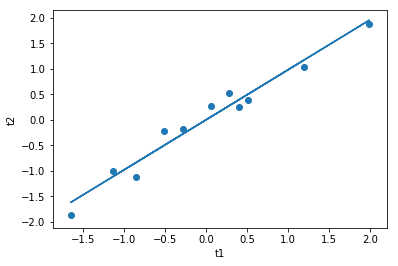

In [19]:
fit_curve(t1, t2, params)

In [138]:
n_epochs = 50000
lr = 0.01
params = torch.tensor([1, 0])
w,b = training_loop_2(n_epochs=n_epochs, lr=lr, params=params, t1=torch.tensor(t1), t2=torch.tensor(t2), delta = 0.001)

Epoch 0, Loss 21.966576
    Parmas: (tensor(1.0158, dtype=torch.float64), tensor(0.0940, dtype=torch.float64))
Epoch 1, Loss 21.101718
    Parmas: (tensor(1.0314, dtype=torch.float64), tensor(0.1862, dtype=torch.float64))
Epoch 2, Loss 20.271108
    Parmas: (tensor(1.0466, dtype=torch.float64), tensor(0.2765, dtype=torch.float64))
Epoch 3, Loss 19.473391
    Parmas: (tensor(1.0615, dtype=torch.float64), tensor(0.3651, dtype=torch.float64))
Epoch 4, Loss 18.707263
    Parmas: (tensor(1.0761, dtype=torch.float64), tensor(0.4518, dtype=torch.float64))
Epoch 5, Loss 17.971474
    Parmas: (tensor(1.0904, dtype=torch.float64), tensor(0.5368, dtype=torch.float64))
Epoch 6, Loss 17.264822
    Parmas: (tensor(1.1045, dtype=torch.float64), tensor(0.6201, dtype=torch.float64))
Epoch 7, Loss 16.586154
    Parmas: (tensor(1.1182, dtype=torch.float64), tensor(0.7018, dtype=torch.float64))
Epoch 8, Loss 15.934360
    Parmas: (tensor(1.1317, dtype=torch.float64), tensor(0.7818, dtype=torch.float64))
E

    Parmas: (tensor(1.7828, dtype=torch.float64), tensor(4.6461, dtype=torch.float64))
Epoch 219, Loss 0.129864
    Parmas: (tensor(1.7830, dtype=torch.float64), tensor(4.6472, dtype=torch.float64))
Epoch 220, Loss 0.129740
    Parmas: (tensor(1.7832, dtype=torch.float64), tensor(4.6483, dtype=torch.float64))
Epoch 221, Loss 0.129621
    Parmas: (tensor(1.7833, dtype=torch.float64), tensor(4.6494, dtype=torch.float64))
Epoch 222, Loss 0.129506
    Parmas: (tensor(1.7835, dtype=torch.float64), tensor(4.6504, dtype=torch.float64))
Epoch 223, Loss 0.129396
    Parmas: (tensor(1.7837, dtype=torch.float64), tensor(4.6515, dtype=torch.float64))
Epoch 224, Loss 0.129291
    Parmas: (tensor(1.7839, dtype=torch.float64), tensor(4.6525, dtype=torch.float64))
Epoch 225, Loss 0.129189
    Parmas: (tensor(1.7840, dtype=torch.float64), tensor(4.6535, dtype=torch.float64))
Epoch 226, Loss 0.129092
    Parmas: (tensor(1.7842, dtype=torch.float64), tensor(4.6545, dtype=torch.float64))
Epoch 227, Loss 0

Epoch 464, Loss 0.126729
    Parmas: (tensor(1.7922, dtype=torch.float64), tensor(4.7020, dtype=torch.float64))
Epoch 465, Loss 0.126729
    Parmas: (tensor(1.7922, dtype=torch.float64), tensor(4.7020, dtype=torch.float64))
Epoch 466, Loss 0.126729
    Parmas: (tensor(1.7922, dtype=torch.float64), tensor(4.7020, dtype=torch.float64))
Epoch 467, Loss 0.126729
    Parmas: (tensor(1.7922, dtype=torch.float64), tensor(4.7020, dtype=torch.float64))
Epoch 468, Loss 0.126729
    Parmas: (tensor(1.7922, dtype=torch.float64), tensor(4.7020, dtype=torch.float64))
Epoch 469, Loss 0.126729
    Parmas: (tensor(1.7922, dtype=torch.float64), tensor(4.7021, dtype=torch.float64))
Epoch 470, Loss 0.126729
    Parmas: (tensor(1.7922, dtype=torch.float64), tensor(4.7021, dtype=torch.float64))
Epoch 471, Loss 0.126729
    Parmas: (tensor(1.7922, dtype=torch.float64), tensor(4.7021, dtype=torch.float64))
Epoch 472, Loss 0.126729
    Parmas: (tensor(1.7922, dtype=torch.float64), tensor(4.7021, dtype=torch.fl

Epoch 716, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 717, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 718, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 719, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 720, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 721, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 722, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 723, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 724, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.fl

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 979, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 980, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 981, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 982, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 983, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 984, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 985, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 986, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 987, Loss 0

Epoch 1248, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1249, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1250, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1251, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1252, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1253, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1254, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1255, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1256, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1454, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1455, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1456, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1457, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1458, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1459, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1460, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1461, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 146

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1713, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1714, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1715, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1716, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1717, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1718, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1719, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1720, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 172

Epoch 1896, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1897, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1898, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1899, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1900, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1901, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1902, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1903, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 1904, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2145, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2146, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2147, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2148, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2149, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2150, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2151, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2152, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 215

Epoch 2376, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2377, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2378, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2379, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2380, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2381, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2382, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2383, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2384, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

Epoch 2640, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2641, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2642, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2643, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2644, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2645, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2646, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2647, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2648, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2876, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2877, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2878, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2879, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2880, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2881, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2882, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 2883, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 288

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3134, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3135, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3136, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3137, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3138, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3139, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3140, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3141, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 314

Epoch 3391, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3392, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3393, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3394, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3395, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3396, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3397, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3398, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3399, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

Epoch 3635, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3636, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3637, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3638, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3639, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3640, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3641, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3642, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3643, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3756, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3757, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3758, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3759, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3760, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3761, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3762, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3763, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 376

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3886, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3887, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3888, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3889, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3890, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3891, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3892, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 3893, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 389

Epoch 4140, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4141, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4142, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4143, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4144, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4145, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4146, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4147, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4148, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4397, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4398, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4399, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4400, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4401, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4402, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4403, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4404, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 440

Epoch 4528, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4529, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4530, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4531, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4532, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4533, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4534, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4535, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4536, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4779, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4780, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4781, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4782, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4783, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4784, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4785, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 4786, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 478

Epoch 5035, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5036, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5037, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5038, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5039, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5040, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5041, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5042, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5043, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

Epoch 5273, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5274, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5275, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5276, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5277, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5278, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5279, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5280, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5281, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5524, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5525, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5526, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5527, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5528, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5529, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5530, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5531, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 553

Epoch 5634, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5635, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5636, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5637, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5638, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5639, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5640, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5641, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5642, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

Epoch 5753, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5754, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5755, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5756, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5757, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5758, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5759, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5760, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5761, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

Epoch 5983, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5984, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5985, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5986, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5987, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5988, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5989, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5990, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 5991, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6263, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6264, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6265, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6266, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6267, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6268, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6269, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6270, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 627

Epoch 6543, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6544, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6545, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6546, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6547, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6548, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6549, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6550, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6551, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

Epoch 6814, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6815, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6816, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6817, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6818, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6819, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6820, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6821, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 6822, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7096, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7097, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7098, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7099, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7100, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7101, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7102, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7103, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 710

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7340, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7341, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7342, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7343, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7344, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7345, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7346, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7347, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 734

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7598, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7599, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7600, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7601, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7602, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7603, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7604, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7605, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 760

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7865, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7866, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7867, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7868, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7869, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7870, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7871, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 7872, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 787

Epoch 8148, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8149, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8150, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8151, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8152, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8153, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8154, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8155, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8156, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8391, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8392, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8393, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8394, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8395, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8396, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8397, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8398, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 839

Epoch 8573, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8574, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8575, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8576, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8577, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8578, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8579, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8580, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8581, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

Epoch 8714, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8715, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8716, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8717, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8718, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8719, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8720, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8721, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8722, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8887, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8888, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8889, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8890, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8891, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8892, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8893, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 8894, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 889

Epoch 9132, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9133, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9134, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9135, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9136, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9137, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9138, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9139, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9140, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

Epoch 9375, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9376, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9377, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9378, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9379, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9380, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9381, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9382, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9383, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9642, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9643, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9644, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9645, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9646, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9647, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9648, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9649, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 965

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9907, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9908, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9909, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9910, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9911, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9912, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9913, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 9914, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 991

Epoch 10131, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10132, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10133, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10134, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10135, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10136, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10137, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10138, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10139, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10373, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10374, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10375, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10376, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10377, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10378, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10379, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10380, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 10637, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10638, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10639, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10640, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10641, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10642, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10643, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10644, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10645, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 10889, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10890, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10891, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10892, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10893, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10894, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10895, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10896, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 10897, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11159, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11160, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11161, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11162, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11163, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11164, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11165, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11166, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11414, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11415, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11416, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11417, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11418, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11419, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11420, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11421, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 11676, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11677, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11678, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11679, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11680, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11681, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11682, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11683, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11684, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11953, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11954, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11955, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11956, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11957, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11958, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11959, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 11960, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12231, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12232, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12233, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12234, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12235, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12236, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12237, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12238, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 12500, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12501, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12502, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12503, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12504, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12505, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12506, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12507, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12508, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 12761, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12762, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12763, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12764, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12765, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12766, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12767, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12768, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 12769, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 13035, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13036, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13037, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13038, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13039, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13040, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13041, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13042, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13043, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13307, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13308, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13309, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13310, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13311, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13312, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13313, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13314, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13583, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13584, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13585, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13586, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13587, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13588, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13589, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13590, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 13841, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13842, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13843, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13844, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13845, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13846, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13847, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13848, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 13849, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 14086, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14087, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14088, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14089, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14090, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14091, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14092, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14093, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14094, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14367, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14368, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14369, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14370, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14371, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14372, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14373, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14374, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14629, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14630, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14631, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14632, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14633, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14634, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14635, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14636, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 14892, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14893, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14894, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14895, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14896, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14897, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14898, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14899, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 14900, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 15162, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15163, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15164, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15165, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15166, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15167, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15168, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15169, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15170, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 15426, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15427, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15428, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15429, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15430, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15431, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15432, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15433, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15434, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15711, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15712, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15713, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15714, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15715, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15716, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15717, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15718, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15969, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15970, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15971, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15972, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15973, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15974, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15975, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 15976, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 16214, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16215, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16216, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16217, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16218, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16219, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16220, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16221, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16222, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16487, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16488, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16489, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16490, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16491, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16492, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16493, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16494, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16765, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16766, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16767, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16768, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16769, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16770, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16771, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 16772, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 17030, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17031, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17032, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17033, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17034, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17035, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17036, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17037, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17038, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17291, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17292, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17293, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17294, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17295, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17296, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17297, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17298, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 17559, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17560, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17561, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17562, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17563, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17564, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17565, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17566, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17567, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 17809, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17810, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17811, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17812, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17813, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17814, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17815, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17816, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 17817, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 18093, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18094, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18095, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18096, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18097, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18098, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18099, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18100, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18101, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18372, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18373, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18374, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18375, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18376, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18377, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18378, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18379, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 18648, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18649, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18650, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18651, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18652, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18653, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18654, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18655, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18656, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18929, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18930, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18931, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18932, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18933, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18934, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18935, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 18936, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19168, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19169, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19170, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19171, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19172, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19173, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19174, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19175, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 19454, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19455, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19456, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19457, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19458, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19459, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19460, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19461, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19462, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19719, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19720, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19721, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19722, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19723, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19724, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19725, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19726, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 19974, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19975, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19976, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19977, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19978, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19979, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19980, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19981, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 19982, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 20240, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20241, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20242, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20243, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20244, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20245, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20246, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20247, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20248, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20511, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20512, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20513, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20514, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20515, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20516, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20517, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20518, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 20774, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20775, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20776, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20777, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20778, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20779, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20780, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20781, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 20782, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 21054, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21055, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21056, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21057, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21058, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21059, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21060, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21061, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21062, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21324, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21325, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21326, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21327, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21328, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21329, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21330, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21331, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21604, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21605, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21606, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21607, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21608, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21609, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21610, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21611, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21875, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21876, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21877, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21878, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21879, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21880, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21881, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 21882, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22128, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22129, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22130, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22131, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22132, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22133, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22134, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22135, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 22401, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22402, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22403, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22404, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22405, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22406, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22407, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22408, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22409, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22673, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22674, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22675, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22676, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22677, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22678, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22679, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22680, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 22948, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22949, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22950, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22951, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22952, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22953, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22954, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22955, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 22956, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23210, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23211, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23212, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23213, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23214, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23215, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23216, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23217, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23485, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23486, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23487, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23488, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23489, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23490, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23491, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23492, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23762, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23763, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23764, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23765, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23766, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23767, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23768, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 23769, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24039, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24040, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24041, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24042, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24043, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24044, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24045, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24046, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 24284, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24285, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24286, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24287, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24288, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24289, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24290, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24291, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24292, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24557, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24558, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24559, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24560, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24561, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24562, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24563, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24564, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 24833, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24834, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24835, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24836, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24837, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24838, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24839, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24840, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 24841, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25108, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25109, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25110, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25111, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25112, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25113, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25114, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25115, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25378, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25379, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25380, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25381, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25382, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25383, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25384, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25385, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25608, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25609, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25610, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25611, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25612, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25613, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25614, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25615, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25860, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25861, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25862, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25863, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25864, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25865, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25866, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 25867, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26117, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26118, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26119, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26120, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26121, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26122, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26123, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26124, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 26339, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26340, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26341, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26342, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26343, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26344, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26345, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26346, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26347, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 26540, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26541, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26542, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26543, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26544, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26545, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26546, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26547, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26548, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 26796, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26797, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26798, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26799, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26800, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26801, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26802, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26803, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 26804, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 27052, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27053, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27054, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27055, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27056, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27057, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27058, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27059, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27060, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27203, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27204, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27205, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27206, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27207, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27208, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27209, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27210, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 27306, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27307, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27308, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27309, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27310, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27311, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27312, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27313, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27314, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27481, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27482, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27483, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27484, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27485, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27486, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27487, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27488, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27714, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27715, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27716, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27717, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27718, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27719, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27720, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27721, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 27982, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27983, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27984, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27985, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27986, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27987, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27988, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27989, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 27990, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 28253, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28254, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28255, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28256, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28257, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28258, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28259, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28260, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28261, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 28526, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28527, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28528, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28529, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28530, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28531, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28532, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28533, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28534, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 28787, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28788, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28789, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28790, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28791, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28792, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28793, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28794, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 28795, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 29005, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29006, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29007, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29008, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29009, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29010, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29011, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29012, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29013, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 29258, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29259, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29260, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29261, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29262, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29263, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29264, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29265, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29266, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 29509, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29510, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29511, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29512, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29513, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29514, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29515, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29516, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29517, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 29753, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29754, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29755, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29756, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29757, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29758, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29759, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29760, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 29761, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30013, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30014, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30015, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30016, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30017, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30018, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30019, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30020, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30261, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30262, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30263, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30264, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30265, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30266, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30267, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30268, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 30511, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30512, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30513, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30514, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30515, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30516, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30517, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30518, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30519, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30750, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30751, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30752, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30753, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30754, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30755, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30756, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 30757, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 31004, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31005, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31006, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31007, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31008, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31009, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31010, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31011, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31012, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31189, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31190, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31191, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31192, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31193, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31194, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31195, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31196, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31276, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31277, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31278, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31279, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31280, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31281, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31282, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31283, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 31506, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31507, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31508, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31509, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31510, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31511, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31512, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31513, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31514, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 31738, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31739, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31740, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31741, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31742, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31743, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31744, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31745, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31746, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31981, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31982, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31983, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31984, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31985, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31986, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31987, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 31988, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32245, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32246, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32247, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32248, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32249, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32250, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32251, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32252, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 32496, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32497, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32498, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32499, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32500, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32501, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32502, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32503, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32504, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 32735, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32736, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32737, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32738, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32739, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32740, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32741, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32742, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32743, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 32981, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32982, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32983, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32984, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32985, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32986, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32987, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32988, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 32989, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33246, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33247, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33248, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33249, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33250, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33251, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33252, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33253, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33475, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33476, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33477, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33478, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33479, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33480, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33481, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33482, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33694, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33695, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33696, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33697, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33698, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33699, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33700, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33701, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 33941, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33942, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33943, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33944, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33945, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33946, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33947, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33948, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 33949, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 34166, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34167, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34168, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34169, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34170, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34171, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34172, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34173, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34174, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34239, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34240, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34241, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34242, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34243, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34244, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34245, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34246, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 34323, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34324, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34325, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34326, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34327, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34328, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34329, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34330, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34331, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 34421, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34422, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34423, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34424, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34425, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34426, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34427, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34428, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34429, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 34510, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34511, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34512, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34513, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34514, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34515, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34516, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34517, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34518, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34735, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34736, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34737, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34738, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34739, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34740, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34741, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34742, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34990, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34991, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34992, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34993, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34994, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34995, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34996, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 34997, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35233, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35234, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35235, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35236, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35237, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35238, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35239, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35240, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35367, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35368, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35369, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35370, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35371, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35372, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35373, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35374, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 35576, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35577, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35578, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35579, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35580, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35581, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35582, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35583, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35584, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 35846, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35847, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35848, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35849, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35850, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35851, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35852, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35853, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 35854, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36077, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36078, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36079, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36080, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36081, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36082, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36083, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36084, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36335, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36336, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36337, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36338, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36339, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36340, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36341, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36342, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 36592, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36593, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36594, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36595, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36596, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36597, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36598, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36599, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36600, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 36717, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36718, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36719, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36720, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36721, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36722, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36723, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36724, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36725, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36870, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36871, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36872, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36873, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36874, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36875, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36876, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36877, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 36955, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36956, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36957, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36958, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36959, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36960, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36961, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36962, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 36963, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 37059, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37060, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37061, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37062, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37063, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37064, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37065, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37066, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37067, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37202, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37203, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37204, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37205, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37206, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37207, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37208, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37209, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37474, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37475, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37476, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37477, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37478, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37479, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37480, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37481, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37730, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37731, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37732, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37733, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37734, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37735, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37736, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37737, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 37958, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37959, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37960, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37961, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37962, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37963, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37964, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37965, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 37966, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38212, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38213, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38214, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38215, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38216, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38217, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38218, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38219, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 38472, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38473, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38474, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38475, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38476, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38477, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38478, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38479, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38480, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 38659, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38660, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38661, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38662, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38663, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38664, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38665, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38666, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38667, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 38761, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38762, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38763, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38764, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38765, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38766, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38767, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38768, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 38769, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39008, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39009, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39010, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39011, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39012, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39013, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39014, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39015, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39271, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39272, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39273, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39274, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39275, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39276, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39277, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39278, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39514, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39515, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39516, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39517, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39518, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39519, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39520, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39521, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39793, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39794, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39795, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39796, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39797, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39798, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39799, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 39800, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40016, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40017, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40018, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40019, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40020, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40021, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40022, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40023, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40279, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40280, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40281, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40282, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40283, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40284, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40285, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40286, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 40529, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40530, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40531, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40532, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40533, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40534, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40535, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40536, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40537, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40695, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40696, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40697, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40698, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40699, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40700, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40701, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40702, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 40767, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40768, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40769, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40770, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40771, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40772, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40773, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40774, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40775, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 40943, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40944, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40945, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40946, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40947, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40948, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40949, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40950, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 40951, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41194, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41195, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41196, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41197, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41198, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41199, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41200, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41201, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41415, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41416, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41417, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41418, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41419, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41420, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41421, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41422, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41692, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41693, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41694, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41695, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41696, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41697, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41698, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41699, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 41960, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41961, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41962, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41963, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41964, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41965, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41966, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41967, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 41968, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42221, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42222, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42223, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42224, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42225, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42226, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42227, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42228, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 42476, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42477, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42478, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42479, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42480, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42481, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42482, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42483, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42484, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 42709, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42710, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42711, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42712, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42713, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42714, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42715, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42716, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42717, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42959, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42960, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42961, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42962, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42963, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42964, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42965, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 42966, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 43239, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43240, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43241, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43242, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43243, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43244, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43245, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43246, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43247, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43347, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43348, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43349, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43350, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43351, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43352, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43353, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43354, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 43535, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43536, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43537, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43538, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43539, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43540, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43541, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43542, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43543, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43818, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43819, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43820, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43821, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43822, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43823, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43824, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 43825, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44097, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44098, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44099, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44100, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44101, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44102, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44103, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44104, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44366, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44367, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44368, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44369, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44370, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44371, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44372, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44373, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 44610, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44611, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44612, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44613, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44614, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44615, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44616, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44617, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44618, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44867, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44868, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44869, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44870, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44871, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44872, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44873, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 44874, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45125, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45126, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45127, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45128, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45129, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45130, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45131, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45132, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45330, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45331, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45332, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45333, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45334, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45335, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45336, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45337, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45411, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45412, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45413, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45414, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45415, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45416, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45417, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45418, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 45490, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45491, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45492, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45493, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45494, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45495, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45496, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45497, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45498, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 45571, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45572, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45573, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45574, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45575, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45576, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45577, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45578, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45579, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45726, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45727, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45728, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45729, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45730, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45731, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45732, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45733, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45822, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45823, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45824, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45825, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45826, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45827, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45828, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45829, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 45967, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45968, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45969, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45970, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45971, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45972, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45973, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45974, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 45975, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 46232, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46233, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46234, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46235, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46236, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46237, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46238, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46239, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46240, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 46497, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46498, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46499, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46500, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46501, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46502, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46503, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46504, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46505, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 46737, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46738, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46739, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46740, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46741, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46742, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46743, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46744, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46745, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 46989, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46990, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46991, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46992, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46993, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46994, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46995, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46996, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 46997, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47234, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47235, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47236, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47237, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47238, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47239, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47240, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47241, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 47483, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47484, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47485, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47486, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47487, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47488, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47489, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47490, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47491, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 47711, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47712, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47713, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47714, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47715, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47716, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47717, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47718, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47719, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47835, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47836, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47837, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47838, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47839, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47840, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47841, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 47842, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 48069, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48070, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48071, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48072, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48073, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48074, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48075, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48076, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48077, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48311, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48312, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48313, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48314, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48315, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48316, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48317, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48318, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 48565, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48566, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48567, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48568, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48569, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48570, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48571, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48572, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48573, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 48793, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48794, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48795, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48796, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48797, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48798, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48799, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48800, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48801, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48945, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48946, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48947, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48948, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48949, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48950, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48951, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 48952, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49061, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49062, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49063, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49064, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49065, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49066, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49067, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49068, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49184, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49185, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49186, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49187, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49188, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49189, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49190, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49191, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49290, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49291, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49292, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49293, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49294, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49295, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49296, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49297, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E

Epoch 49428, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49429, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49430, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49431, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49432, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49433, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49434, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49435, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49436, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

Epoch 49676, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49677, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49678, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49679, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49680, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49681, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49682, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49683, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49684, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.70

    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49930, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49931, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49932, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49933, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49934, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49935, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49936, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
Epoch 49937, Loss 0.126729
    Parmas: (tensor(1.7923, dtype=torch.float64), tensor(4.7024, dtype=torch.float64))
E